In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import itertools 
import seaborn as sns 
import statsmodels.api as sm 
import matplotlib as mpl 

from scipy.stats import skew

from sklearn.utils import resample 
from sklearn.preprocessing import scale, StandardScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.decomposition import PCA  
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.preprocessing import PolynomialFeatures

%matplotlib inline 
%config InlineBackend.figure_format = 'retina'
mpl.rcParams.update(mpl.rcParamsDefault)


<b>Reading dataset and basic exploratory data analysis (EDA)</b>

In [2]:
df = pd.read_csv('jamb_exam_results.csv', sep=",")
df.head() 

,JAMB_Score,Study_Hours_Per_Week,Attendance_Rate,Teacher_Quality,Distance_To_School,School_Type,School_Location,Extra_Tutorials,Access_To_Learning_Materials,Parent_Involvement,IT_Knowledge,Student_ID,Age,Gender,Socioeconomic_Status,Parent_Education_Level,Assignments_Completed
0,192,22,78,4,12.4,Public,Urban,Yes,Yes,High,Medium,1,17,Male,Low,Tertiary,2
1,207,14,88,4,2.7,Public,Rural,No,Yes,High,High,2,15,Male,High,None,1
2,182,29,87,2,9.6,Public,Rural,Yes,Yes,High,Medium,3,20,Female,High,Tertiary,2
3,210,29,99,2,2.6,Public,Urban,No,Yes,Medium,High,4,22,Female,Medium,Tertiary,1
4,199,12,98,3,8.8,Public,Urban,No,Yes,Medium,Medium,5,22,Female,Medium,Tertiary,1


In [3]:
df.groupby(["Parent_Education_Level","Socioeconomic_Status", "School_Type","School_Location","Extra_Tutorials"]).count()

JAMB_Score  \
Parent_Education_Level Socioeconomic_Status School_Type School_Location Extra_Tutorials               
None                   High                 Private     Rural           No                        4   
                                                                        Yes                       1   
                                                        Urban           No                        3   
                                                                        Yes                       3   
                                            Public      Rural           No                        6   
...                                                                                             ...   
Tertiary               Medium               Private     Urban           Yes                      34   
                                            Public      Rural           No                       81   
                                                                        Yes                      79   
                                                        Urban           No                      105   
                                                                        Yes                      99   

                                                                                         Study_Hours_Per_Week  \
Parent_Education_Level Socioeconomic_Status School_Type School_Location Extra_Tutorials                         
None                   High                 Private     Rural           No                                  4   
                                                                        Yes                                 1   
                                                        Urban           No                                  3   
                                                                        Yes                                 3   
                                            Public      Rural           No                                  6   
...                                                                                                       ...   
Tertiary               Medium               Private     Urban           Yes                                34   
                                            Public      Rural           No                                 81   
                                                                        Yes                                79   
                                                        Urban           No                                105   
                                                                        Yes                                99   

                                                                                         Attendance_Rate  \
Parent_Education_Level Socioeconomic_Status School_Type School_Location Extra_Tutorials                    
None                   High                 Private     Rural           No                             4   
                                                                        Yes                            1   
                                                        Urban           No                             3   
                                                                        Yes                            3   
                                            Public      Rural           No                             6   
...                                                                                                  ...   
Tertiary               Medium               Private     Urban           Yes                           34   
                                            Public      Rural           No                            81   
                                                                        Yes                           79   
                                                        Urban           No                 

In [4]:
print(df.groupby(["Socioeconomic_Status","School_Type", "School_Location","Parent_Education_Level", "Extra_Tutorials"]).count())

                                                                                         JAMB_Score  \
Socioeconomic_Status School_Type School_Location Parent_Education_Level Extra_Tutorials               
High                 Private     Rural           None                   No                        4   
                                                                        Yes                       1   
                                                 Primary                No                        8   
                                                                        Yes                      10   
                                                 Secondary              No                       17   
...                                                                                             ...   
Medium               Public      Urban           Primary                Yes                     138   
                                                 Secondary              N

In [5]:
filtered_df_1 = df[
    (df['Parent_Education_Level'] == 'Tertiary') &
    (df['Socioeconomic_Status'] == 'High') &
    (df['School_Type'] == 'Private') &
    (df['School_Location'] == 'Urban') &
    (df['Extra_Tutorials'] == 'Yes')
]

filtered_df_1.describe()

,JAMB_Score,Study_Hours_Per_Week,Attendance_Rate,Teacher_Quality,Distance_To_School,Student_ID,Age,Assignments_Completed
count,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000,46.000000
mean,196.652174,21.717391,85.347826,2.652174,8.489130,2533.043478,18.804348,2.021739
std,50.128376,8.788030,11.013562,0.874767,4.864668,1464.136286,2.334472,0.856067
min,107.000000,4.000000,55.000000,1.000000,0.400000,58.000000,15.000000,1.000000
25%,166.250000,15.250000,77.500000,2.000000,4.325000,1093.750000,17.000000,1.000000
50%,191.500000,23.000000,88.500000,3.000000,8.600000,2771.000000,19.000000,2.000000
75%,227.750000,27.750000,92.750000,3.000000,11.950000,3619.750000,21.000000,3.000000
max,319.000000,40.000000,100.000000,5.000000,17.600000,4785.000000,22.000000,4.000000


In [6]:
df

,JAMB_Score,Study_Hours_Per_Week,Attendance_Rate,Teacher_Quality,Distance_To_School,School_Type,School_Location,Extra_Tutorials,Access_To_Learning_Materials,Parent_Involvement,IT_Knowledge,Student_ID,Age,Gender,Socioeconomic_Status,Parent_Education_Level,Assignments_Completed
0,192,22,78,4,12.4,Public,Urban,Yes,Yes,High,Medium,1,17,Male,Low,Tertiary,2
1,207,14,88,4,2.7,Public,Rural,No,Yes,High,High,2,15,Male,High,None,1
2,182,29,87,2,9.6,Public,Rural,Yes,Yes,High,Medium,3,20,Female,High,Tertiary,2
3,210,29,99,2,2.6,Public,Urban,No,Yes,Medium,High,4,22,Female,Medium,Tertiary,1
4,199,12,98,3,8.8,Public,Urban,No,Yes,Medium,Medium,5,22,Female,Medium,Tertiary,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,183,20,74,2,10.6,Public,Urban,Yes,No,Low,Low,4996,16,Male,Medium,Primary,2
4996,179,0,80,2,20.0,Public,Rural,No,Yes,Medium,Medium,4997,22,Male,Low,Secondary,1
4997,261,17,89,3,11.3,Public,Urban,No,No,Low,High,4998,18,Male,Medium,Primary,3
4998,183,15,96,2,15.9,Public,Rural,No,No,Low,Medium,4999,18,Male,Medium,Secondary,1


In [7]:
df.iloc[:,0:].describe()

,JAMB_Score,Study_Hours_Per_Week,Attendance_Rate,Teacher_Quality,Distance_To_School,Student_ID,Age,Assignments_Completed
count,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000,5000.000000
mean,174.074600,19.521200,84.235200,2.521400,10.005460,2500.500000,18.445800,1.804600
std,47.616477,9.634569,9.485688,0.985564,4.820221,1443.520003,2.301504,0.992076
min,100.000000,0.000000,50.000000,1.000000,0.000000,1.000000,15.000000,1.000000
25%,135.000000,13.000000,78.000000,2.000000,6.600000,1250.750000,16.000000,1.000000
50%,170.000000,19.000000,84.000000,2.000000,10.000000,2500.500000,18.000000,1.000000
75%,209.000000,26.000000,91.000000,3.000000,13.400000,3750.250000,20.000000,2.000000
max,367.000000,40.000000,100.000000,5.000000,20.000000,5000.000000,22.000000,5.000000


In [8]:
print(df.var())
print(df.mean())

JAMB_Score               2.267329e+03
Study_Hours_Per_Week     9.282492e+01
Attendance_Rate          8.997828e+01
Teacher_Quality          9.713363e-01
Distance_To_School       2.323453e+01
Student_ID               2.083750e+06
Age                      5.296922e+00
Assignments_Completed    9.842157e-01
dtype: float64
JAMB_Score                174.07460
Study_Hours_Per_Week       19.52120
Attendance_Rate            84.23520
Teacher_Quality             2.52140
Distance_To_School         10.00546
Student_ID               2500.50000
Age                        18.44580
Assignments_Completed       1.80460
dtype: float64


<ipython-input-8-cb8a8ca41da4>:1: FutureWarning: The default value of numeric_only in DataFrame.var is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(df.var())
<ipython-input-8-cb8a8ca41da4>:2: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(df.mean())


In [9]:
df.isnull().sum()

JAMB_Score                      0
Study_Hours_Per_Week            0
Attendance_Rate                 0
Teacher_Quality                 0
Distance_To_School              0
School_Type                     0
School_Location                 0
Extra_Tutorials                 0
Access_To_Learning_Materials    0
Parent_Involvement              0
IT_Knowledge                    0
Student_ID                      0
Age                             0
Gender                          0
Socioeconomic_Status            0
Parent_Education_Level          0
Assignments_Completed           0
dtype: int64

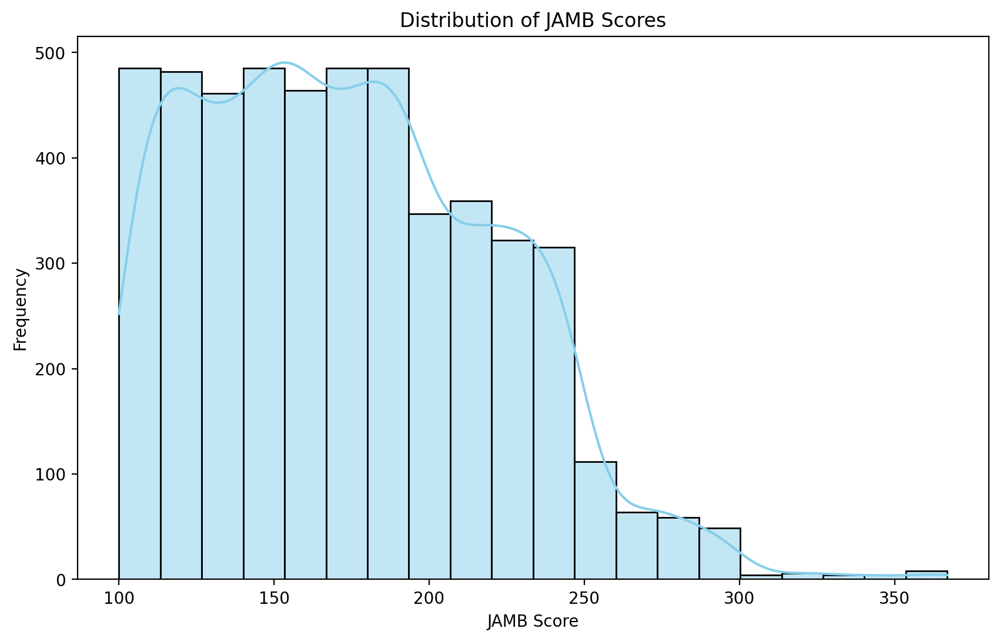

In [10]:
plt.figure(figsize=(10, 6))
sns.histplot(df['JAMB_Score'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of JAMB Scores')
plt.xlabel('JAMB Score')
plt.ylabel('Frequency')
plt.show()

<ipython-input-11-2dfdcbb9160a>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df.corr()


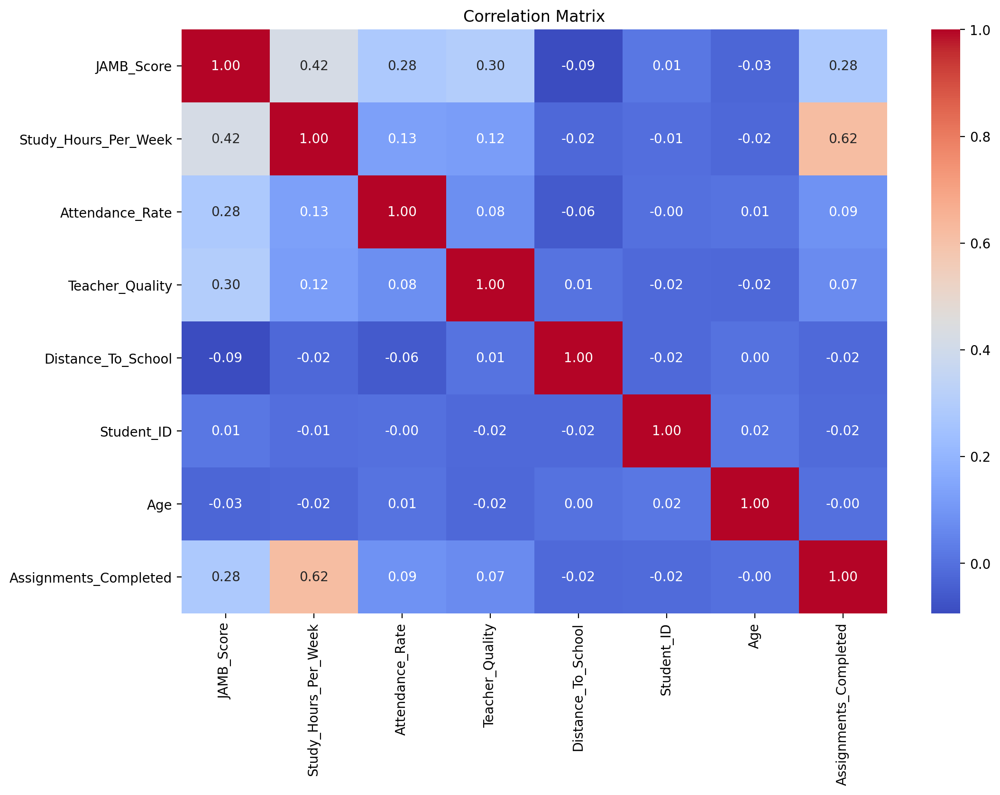

In [11]:
corr_matrix = df.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

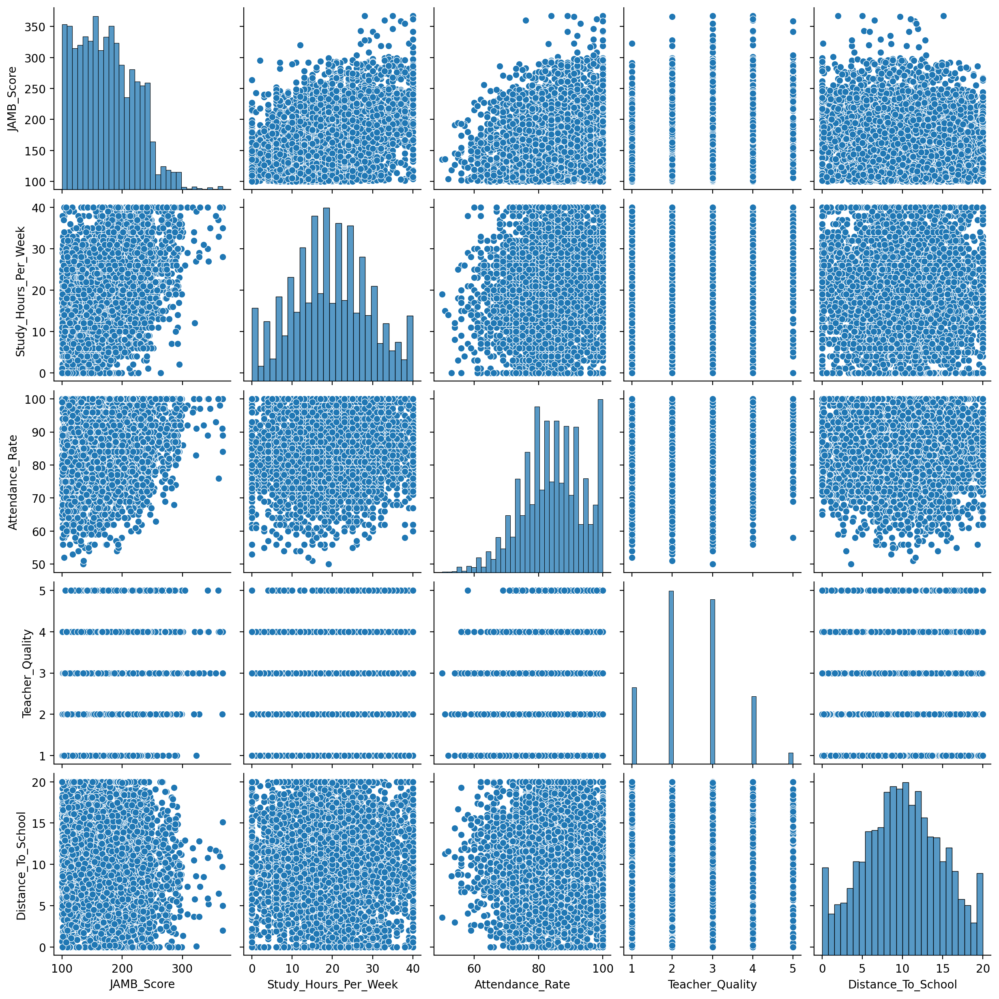

In [12]:
sns.pairplot(df, vars=['JAMB_Score', 'Study_Hours_Per_Week', 'Attendance_Rate', "Teacher_Quality", "Distance_To_School"])
plt.show()

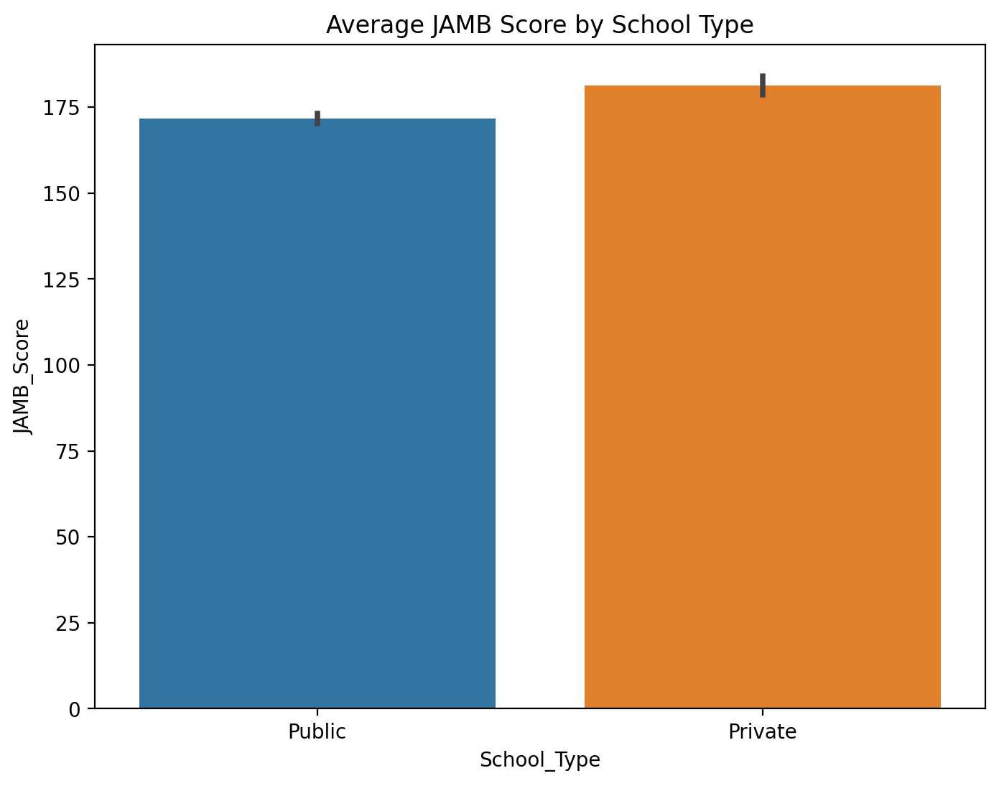

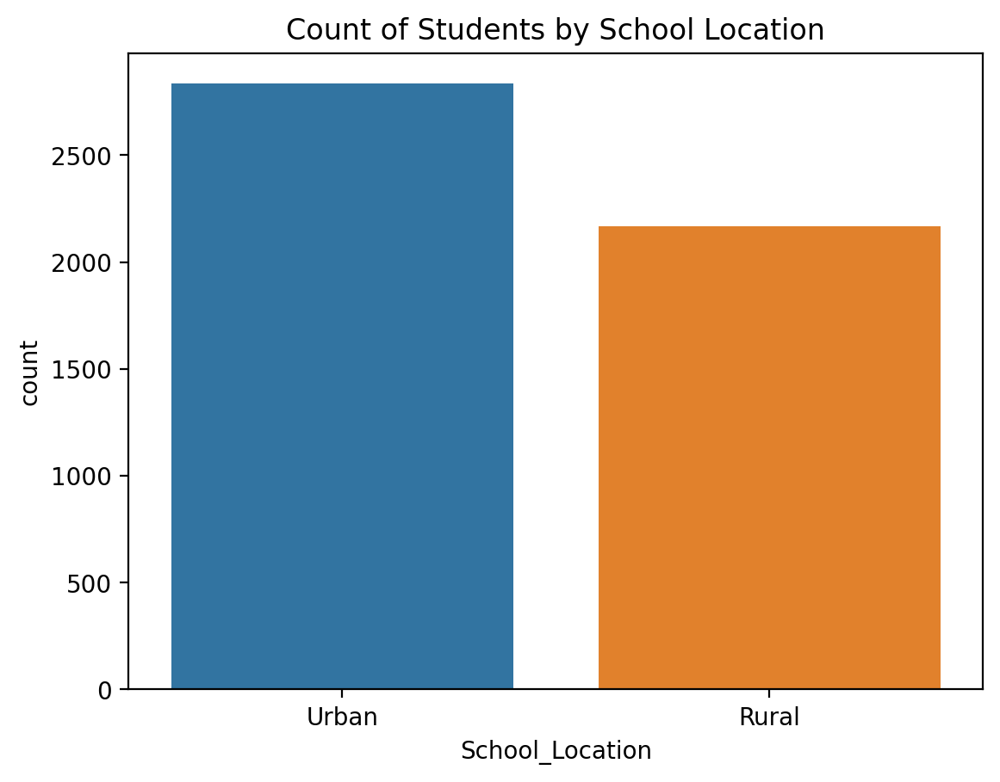

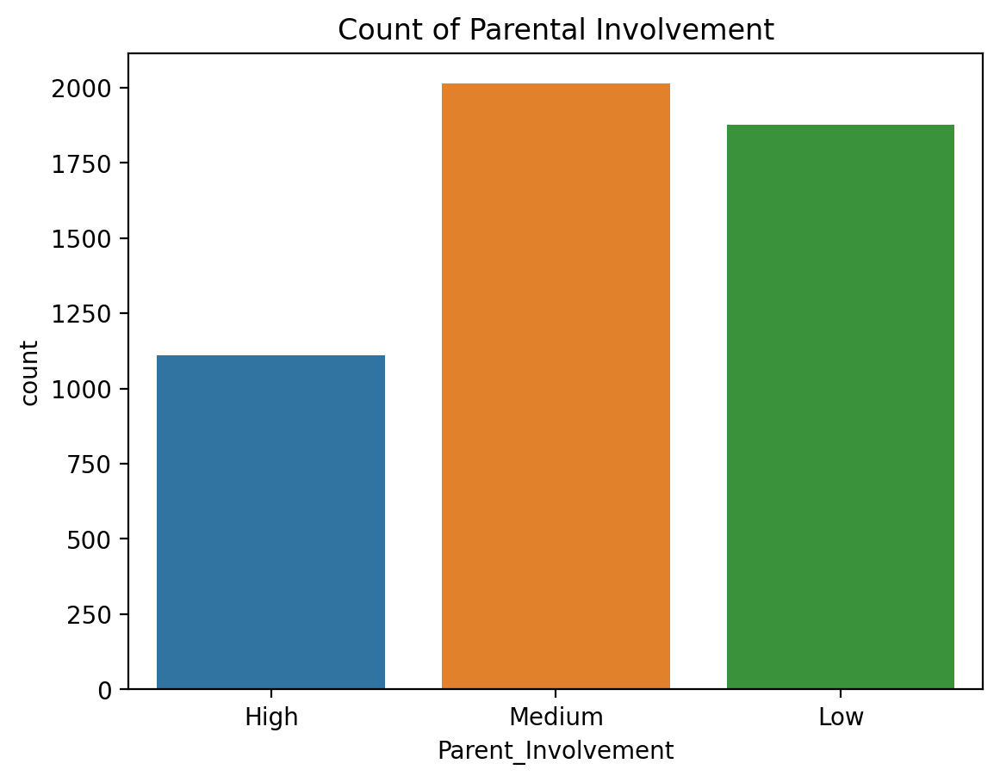

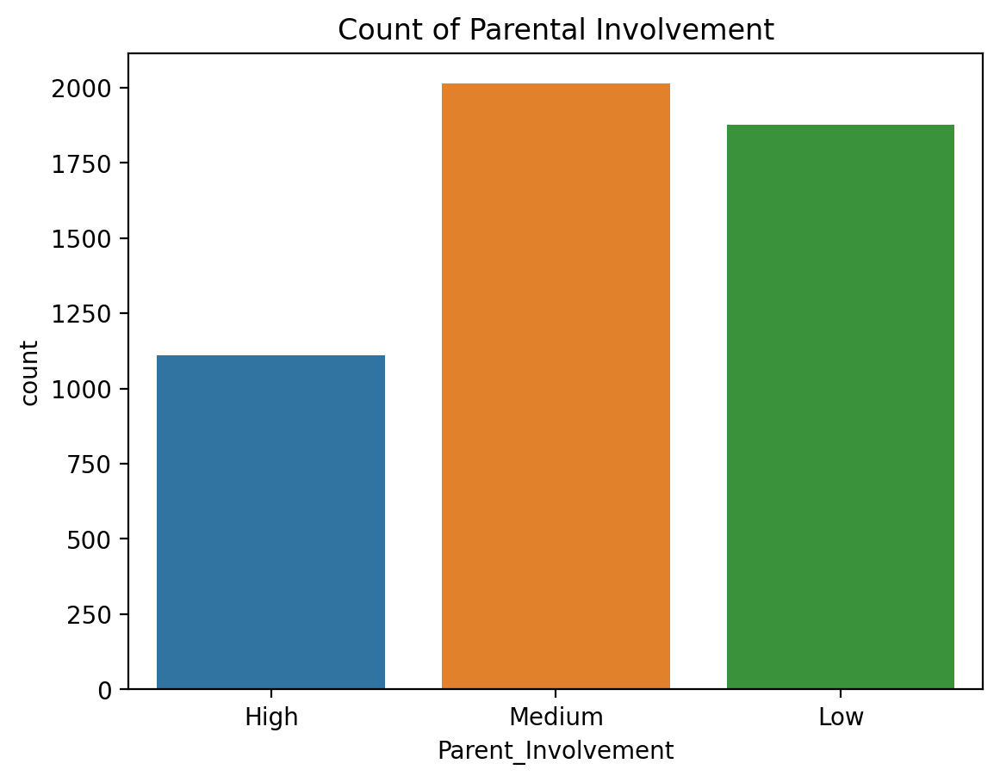

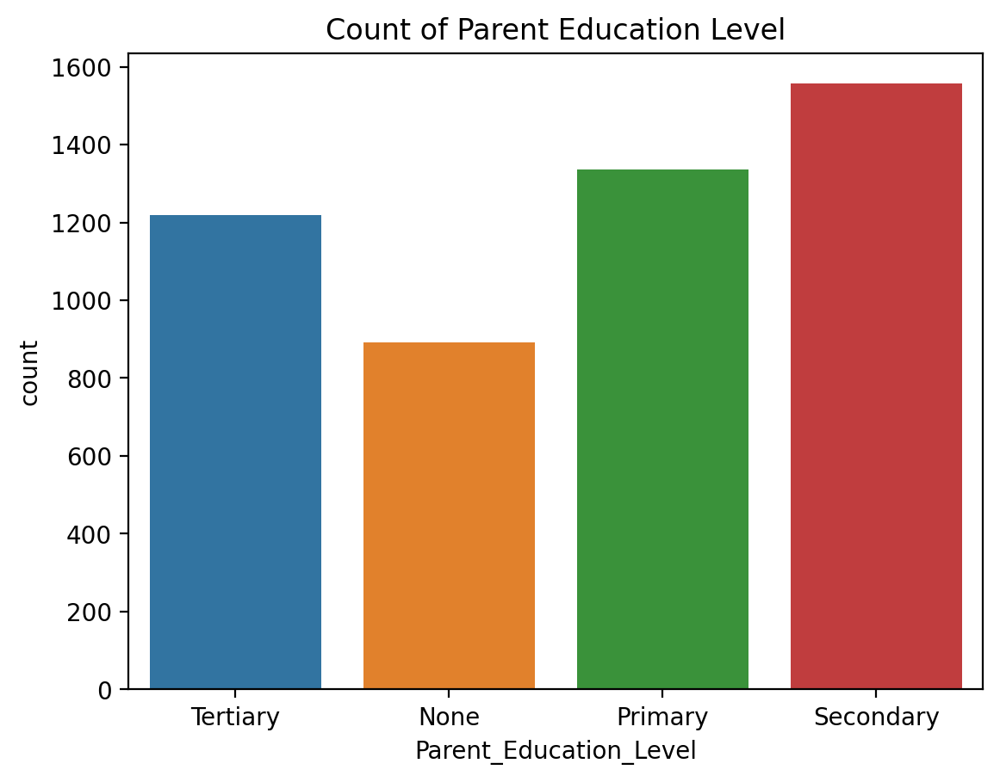

In [13]:
plt.figure(figsize=(8, 6))
sns.barplot(x='School_Type', y='JAMB_Score', data=df)
plt.title('Average JAMB Score by School Type')
plt.show()

sns.countplot(x='School_Location', data=df)
plt.title('Count of Students by School Location')
plt.show()

sns.countplot(x='Parent_Involvement', data=df)
plt.title('Count of Parental Involvement')
plt.show()

sns.countplot(x='Parent_Involvement', data=df)
plt.title('Count of Parental Involvement')
plt.show()

sns.countplot(x='Parent_Education_Level', data=df)
plt.title('Count of Parent Education Level')
plt.show()


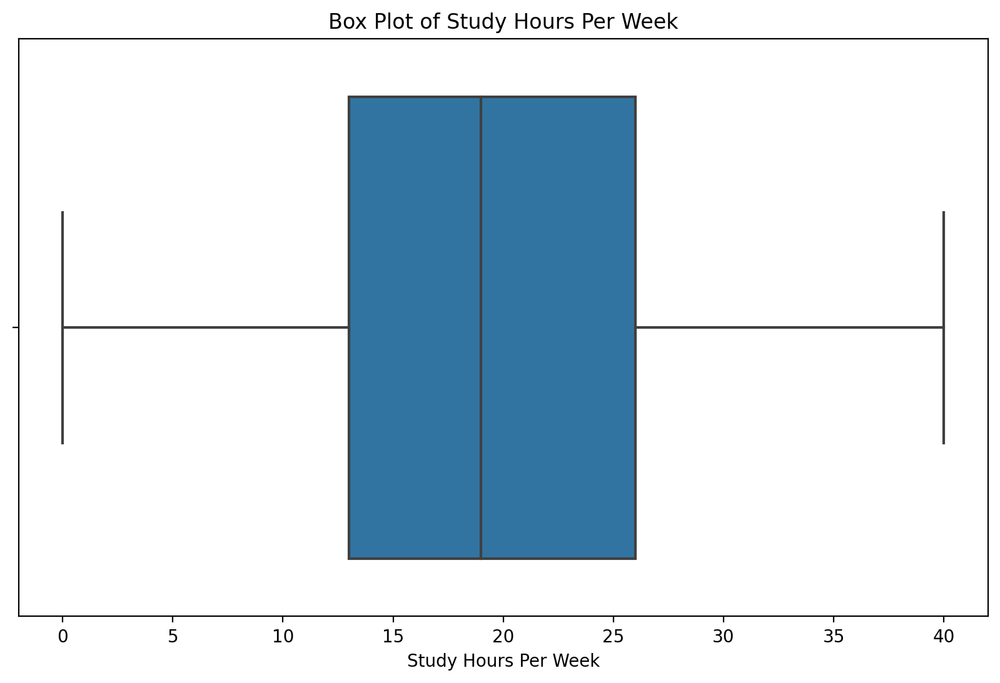

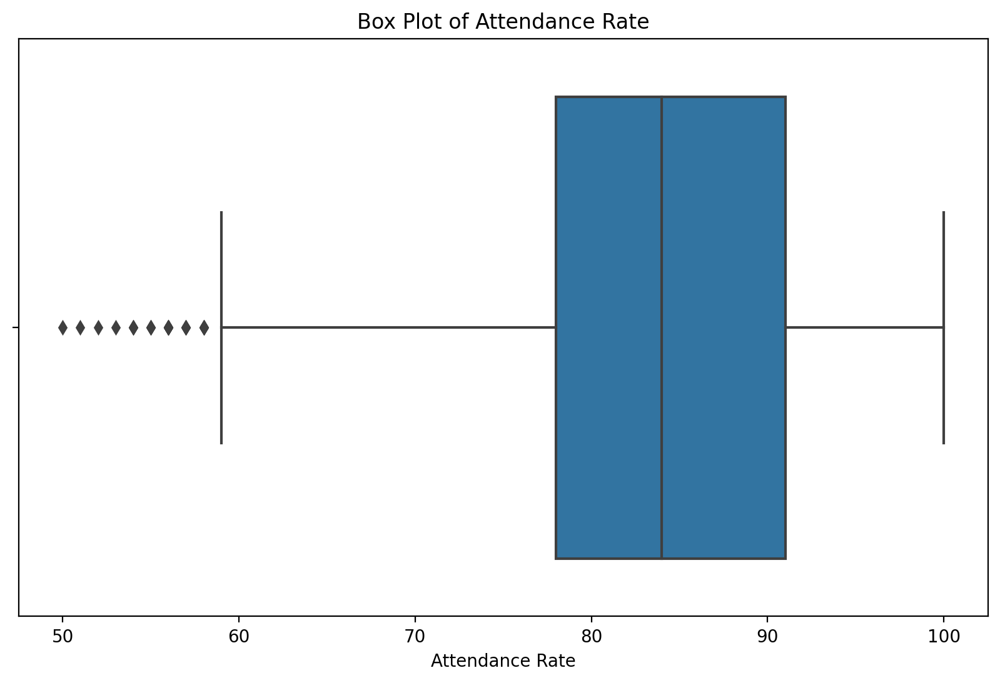

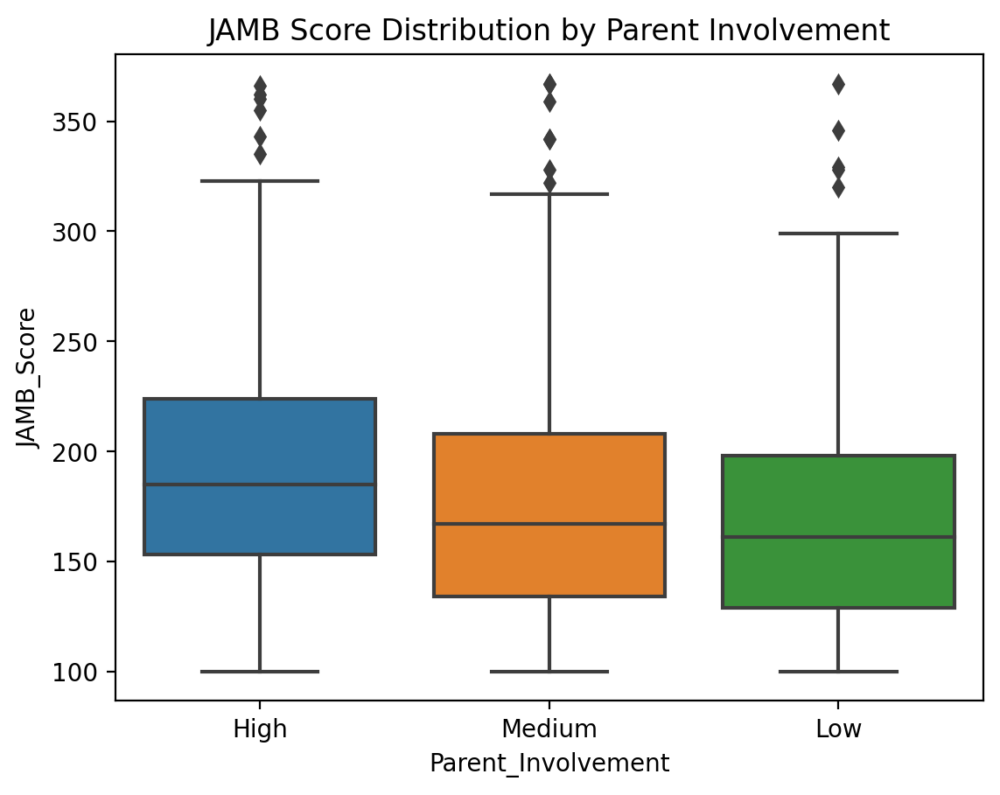

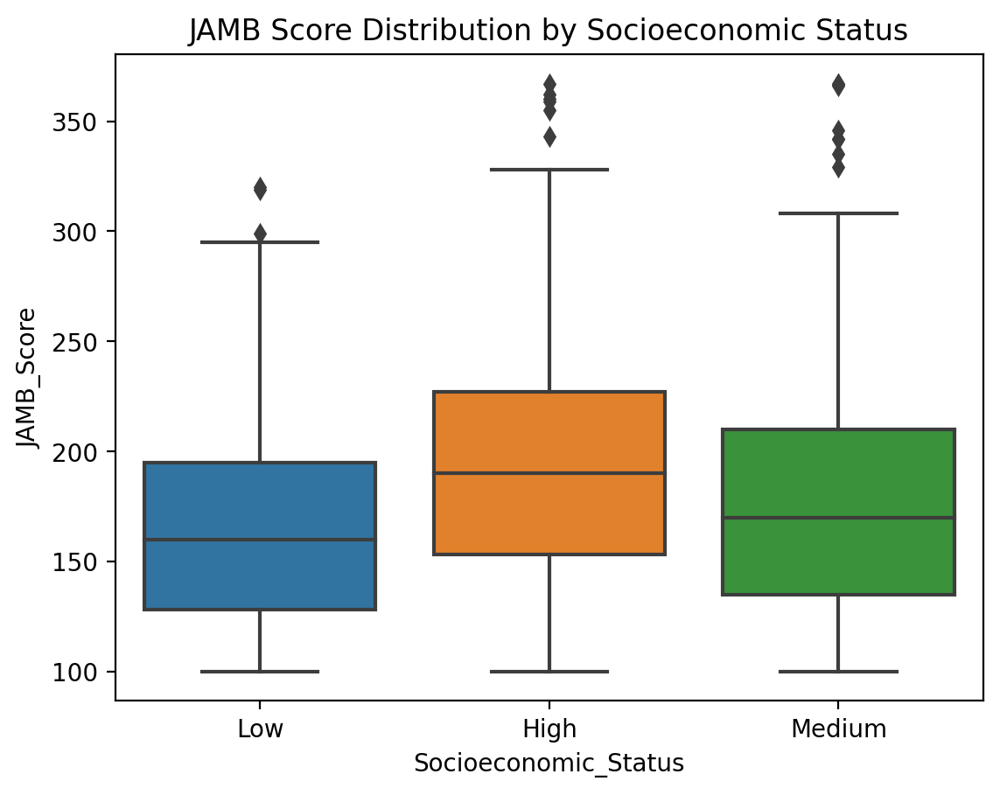

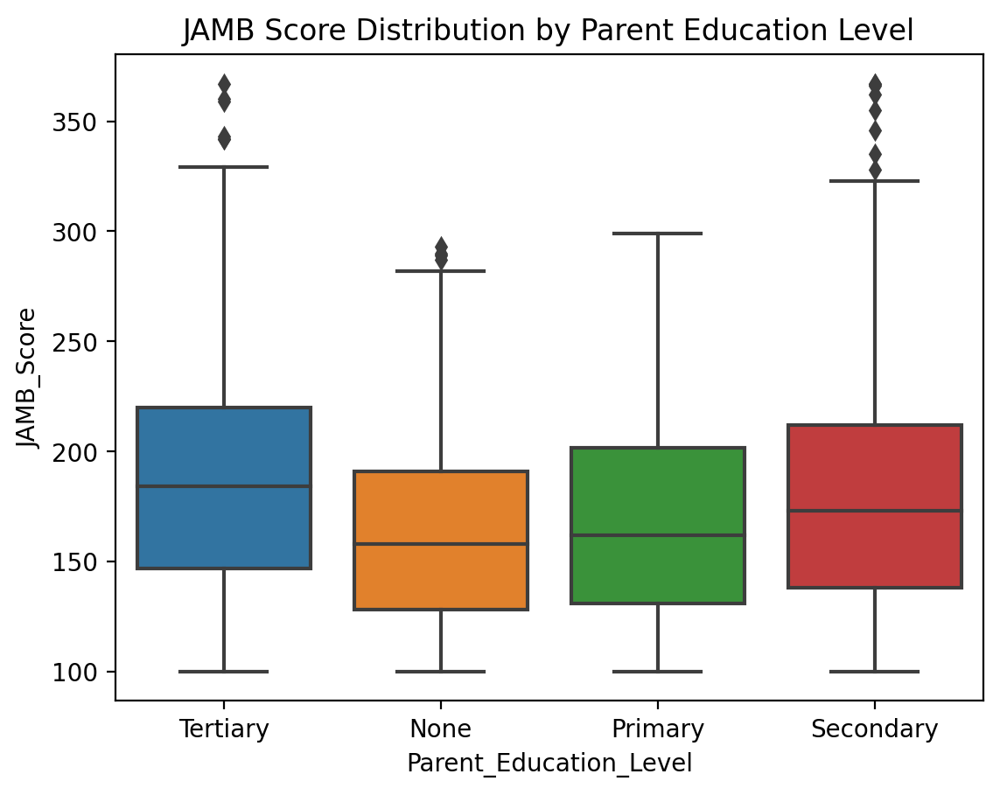

In [14]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Study_Hours_Per_Week', data=df)
plt.title('Box Plot of Study Hours Per Week')
plt.xlabel('Study Hours Per Week')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x='Attendance_Rate', data=df)
plt.title('Box Plot of Attendance Rate')
plt.xlabel('Attendance Rate')
plt.show()

sns.boxplot(x='Parent_Involvement', y='JAMB_Score', data=df)
plt.title('JAMB Score Distribution by Parent Involvement')
plt.show()

sns.boxplot(x='Socioeconomic_Status', y='JAMB_Score', data=df)
plt.title('JAMB Score Distribution by Socioeconomic Status')
plt.show()

sns.boxplot(x='Parent_Education_Level', y='JAMB_Score', data=df)
plt.title('JAMB Score Distribution by Parent Education Level')
plt.show()

**Best Subset Selection**

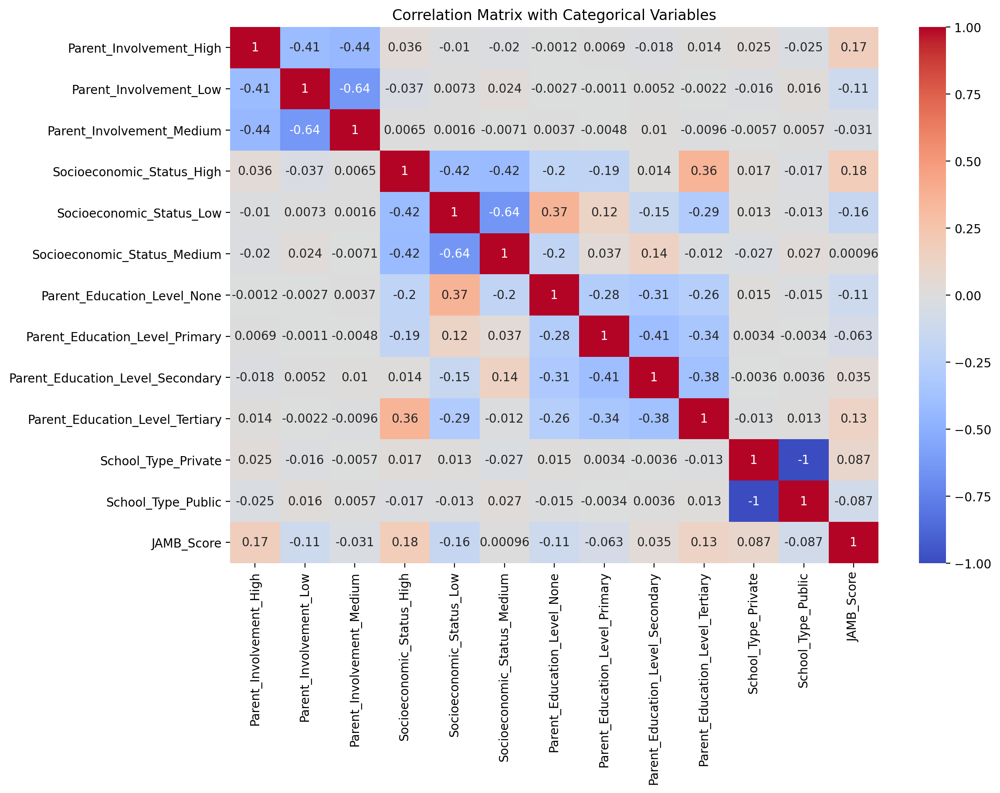

In [15]:
df_encoded = pd.get_dummies(df[['Parent_Involvement', 'Socioeconomic_Status', 'Parent_Education_Level', 'School_Type']])
df_encoded['JAMB_Score'] = df['JAMB_Score']

corr_matrix = df_encoded.corr()

plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix with Categorical Variables')
plt.show()

In [16]:
dummies = pd.get_dummies(df[['School_Type', 'School_Location', 'Extra_Tutorials', 'Access_To_Learning_Materials', 'Parent_Involvement', 'IT_Knowledge', 'Socioeconomic_Status', 'Parent_Education_Level']])
print(dummies)

      School_Type_Private  School_Type_Public  School_Location_Rural  \
0                       0                   1                      0   
1                       0                   1                      1   
2                       0                   1                      1   
3                       0                   1                      0   
4                       0                   1                      0   
...                   ...                 ...                    ...   
4995                    0                   1                      0   
4996                    0                   1                      1   
4997                    0                   1                      0   
4998                    0                   1                      1   
4999                    0                   1                      0   

      School_Location_Urban  Extra_Tutorials_No  Extra_Tutorials_Yes  \
0                         1                   0                

In [17]:
y = df.JAMB_Score
print(y)

0       192
1       207
2       182
3       210
4       199
       ... 
4995    183
4996    179
4997    261
4998    183
4999    218
Name: JAMB_Score, Length: 5000, dtype: int64


In [18]:
bins = [0, 100, 200, 300, 400]

df['Score_Bins'] = pd.cut(y, bins=bins, right=False)
bin_counts = df['Score_Bins'].value_counts().sort_index()

# Display the result
print(bin_counts)

[0, 100)         0
[100, 200)    3547
[200, 300)    1427
[300, 400)      26
Name: Score_Bins, dtype: int64


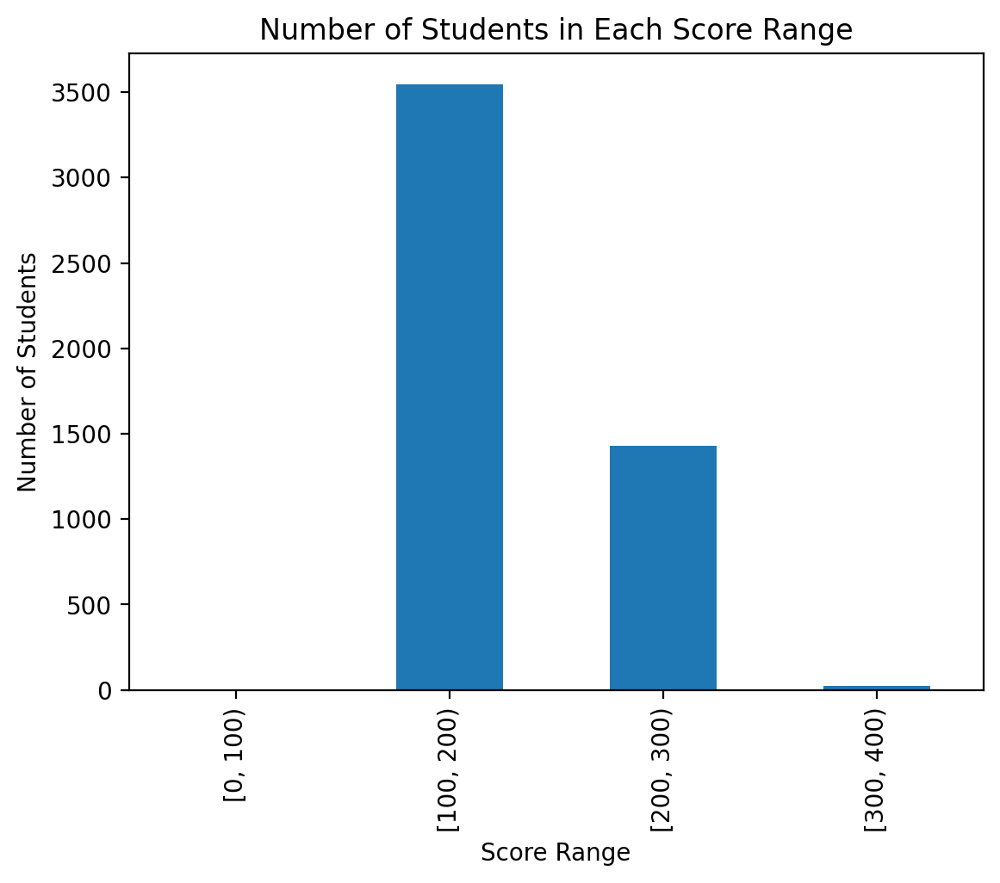

In [19]:
bin_counts.plot(kind='bar')
plt.title('Number of Students in Each Score Range')
plt.xlabel('Score Range')
plt.ylabel('Number of Students')
plt.show()

In [26]:
X = df.drop(['JAMB_Score', 'Score_Bins', 'School_Type', 'School_Location', 'Extra_Tutorials', 'Access_To_Learning_Materials', 'Parent_Involvement', 'IT_Knowledge', 'Socioeconomic_Status', 'Parent_Education_Level', 'Gender','Student_ID'], axis=1)

X = pd.concat([X, dummies[['Parent_Involvement_High', 'Socioeconomic_Status_High', 'Parent_Education_Level_Tertiary','Extra_Tutorials_No', 'Extra_Tutorials_Yes','School_Type_Private', 'School_Type_Public','School_Location_Rural', 'School_Location_Urban','Access_To_Learning_Materials_Yes','Access_To_Learning_Materials_No']]], axis=1)
print(X)

      Study_Hours_Per_Week  Attendance_Rate  Teacher_Quality  \
0                       22               78                4   
1                       14               88                4   
2                       29               87                2   
3                       29               99                2   
4                       12               98                3   
...                    ...              ...              ...   
4995                    20               74                2   
4996                     0               80                2   
4997                    17               89                3   
4998                    15               96                2   
4999                    34              100                1   

      Distance_To_School  Age  Assignments_Completed  Parent_Involvement_High  \
0                   12.4   17                      2                        1   
1                    2.7   15                      1                 

In [27]:
def processSubset(feature_set):
    model = sm.OLS(y,X[list(feature_set)])
    regr = model.fit()
    RSS = ((regr.predict(X[list(feature_set)]) - y) ** 2).sum()
    return {"model":regr, "RSS":RSS}

In [28]:
def getBest(k):
    results = []
    for combo in itertools.combinations(X.columns, k): 
        results.append(processSubset(combo))
    models = pd.DataFrame(results)    
    best_model = models.loc[models['RSS'].argmin()]
    return best_model

models_best = pd.DataFrame(columns=["RSS", "model"])
maxnpred=5
for i in range(1,maxnpred):
     models_best.loc[i] = getBest(i)
print(models_best)

               RSS                                              model
1  10630959.883389  <statsmodels.regression.linear_model.Regressio...
2   8837677.134763  <statsmodels.regression.linear_model.Regressio...
3   8132659.845111  <statsmodels.regression.linear_model.Regressio...
4    7926619.80991  <statsmodels.regression.linear_model.Regressio...


In [43]:
print(getBest(4)["model"].summary())

Processed 2380 models on 4 predictors in 18.33702778816223 seconds.
                                 OLS Regression Results                                
Dep. Variable:             JAMB_Score   R-squared (uncentered):                   0.951
Model:                            OLS   Adj. R-squared (uncentered):              0.951
Method:                 Least Squares   F-statistic:                          2.441e+04
Date:                Thu, 14 Nov 2024   Prob (F-statistic):                        0.00
Time:                        17:30:59   Log-Likelihood:                         -25516.
No. Observations:                5000   AIC:                                  5.104e+04
Df Residuals:                    4996   BIC:                                  5.107e+04
Df Model:                           4                                                  
Covariance Type:            nonrobust                                                  
                                coef    std err     

In [44]:
print(models_best.apply(lambda row: row[1].rsquared, axis=1))

print(models_best.apply(lambda row: row[1].aic, axis=1))

print(models_best.apply(lambda row: row[1].bic, axis=1))

1    0.934717
2    0.945729
3    0.950059
4    0.951324
dtype: float64
1    52501.824604
2    51580.092538
3    51166.412336
4    51040.105621
dtype: float64
1    52508.341797
2    51593.126924
3    51185.963916
4    51066.174394
dtype: float64


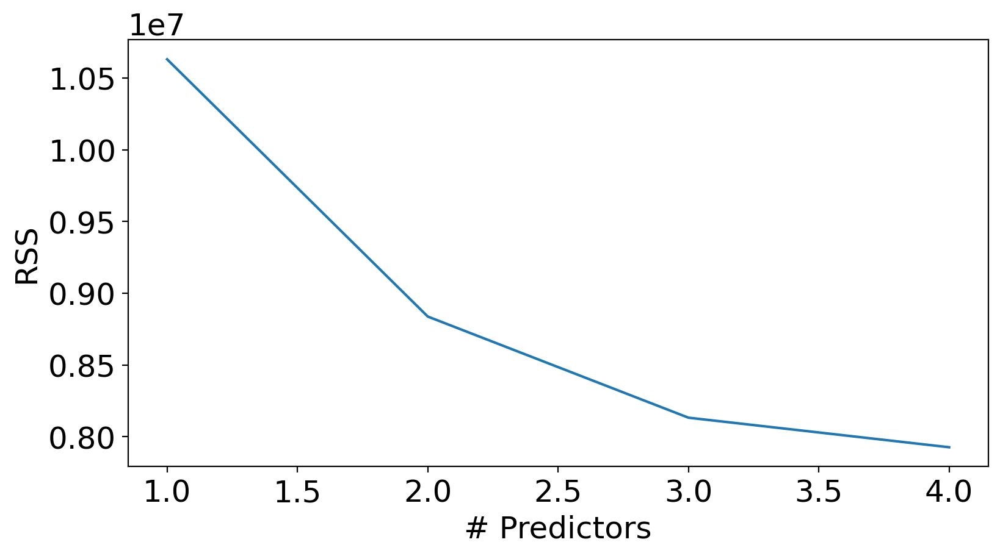

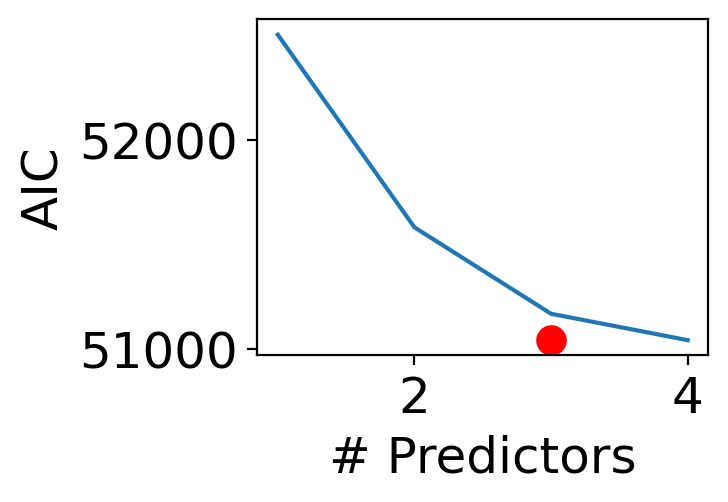

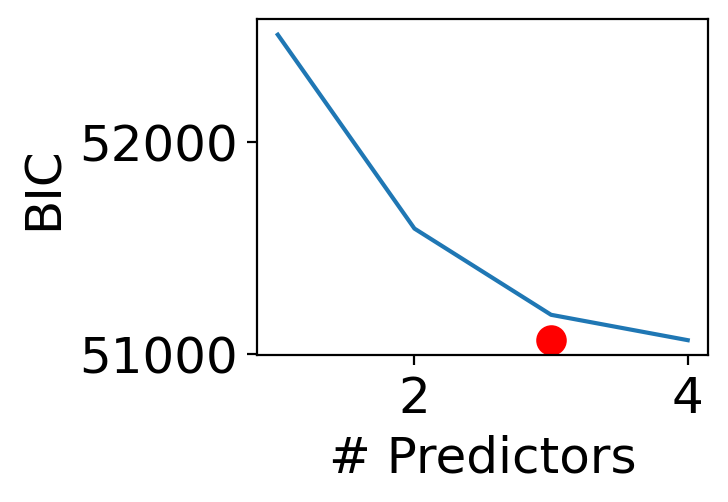

In [45]:
plt.figure(figsize=(20,10))
plt.rcParams.update({'font.size': 18, 'lines.markersize': 10})

plt.subplot(2, 2, 1)

plt.plot(models_best["RSS"])
plt.xlabel('# Predictors')
plt.ylabel('RSS')
plt.show()

rsquared_adj = models_best.apply(lambda row: row[1].rsquared_adj, axis=1)

aic = models_best.apply(lambda row: row[1].aic, axis=1)

plt.subplot(2, 2, 2)
plt.plot(aic)
plt.plot(aic.argmin(), aic.min(), "or")
plt.xlabel('# Predictors')
plt.ylabel('AIC')
plt.show()

bic = models_best.apply(lambda row: row[1].bic, axis=1)

plt.subplot(2, 2, 3)
plt.plot(bic)
plt.plot(bic.argmin(), bic.min(), "or")
plt.xlabel('# Predictors')
plt.ylabel('BIC')
plt.show()

**Interaction Terms and Residuals**

In [12]:
A = X.copy()
A['Interaction_StudyHours_ParentInvolvement'] = X['Study_Hours_Per_Week'] * X['Parent_Involvement_High']
A['Interaction_Attendance_Socioeconomic'] = X['Attendance_Rate'] * X['Socioeconomic_Status_High']
A['Interaction_Teacher_ParentEducation'] = X['Teacher_Quality'] * X['Parent_Education_Level_Tertiary']
A['Interaction_StudyHours_Attendance'] = X['Study_Hours_Per_Week'] * X['Attendance_Rate']


In [13]:
A

,Study_Hours_Per_Week,Attendance_Rate,Teacher_Quality,Distance_To_School,Age,Assignments_Completed,Parent_Involvement_High,Socioeconomic_Status_High,Parent_Education_Level_Tertiary,Extra_Tutorials_No,...,School_Type_Private,School_Type_Public,School_Location_Rural,School_Location_Urban,Access_To_Learning_Materials_Yes,Access_To_Learning_Materials_No,Interaction_StudyHours_ParentInvolvement,Interaction_Attendance_Socioeconomic,Interaction_Teacher_ParentEducation,Interaction_StudyHours_Attendance
0,22,78,4,12.4,17,2,1,0,1,0,...,0,1,0,1,1,0,22,0,4,1716
1,14,88,4,2.7,15,1,1,1,0,1,...,0,1,1,0,1,0,14,88,0,1232
2,29,87,2,9.6,20,2,1,1,1,0,...,0,1,1,0,1,0,29,87,2,2523
3,29,99,2,2.6,22,1,0,0,1,1,...,0,1,0,1,1,0,0,0,2,2871
4,12,98,3,8.8,22,1,0,0,1,1,...,0,1,0,1,1,0,0,0,3,1176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,20,74,2,10.6,16,2,0,0,0,0,...,0,1,0,1,0,1,0,0,0,1480
4996,0,80,2,20.0,22,1,0,0,0,1,...,0,1,1,0,1,0,0,0,0,0
4997,17,89,3,11.3,18,3,0,0,0,1,...,0,1,0,1,0,1,0,0,0,1513
4998,15,96,2,15.9,18,1,0,0,0,1,...,0,1,1,0,0,1,0,0,0,1440


In [48]:
def processSubset(feature_set):
    model = sm.OLS(y, A[list(feature_set)]).fit()
    RSS = ((model.predict(A[list(feature_set)]) - y) ** 2).sum()
    return {"model": model, "RSS": RSS}

def getBest(k):
    results = []
    for combo in itertools.combinations(A.columns, k):
        results.append(processSubset(combo))
    models = pd.DataFrame(results)
    best_model = models.loc[models['RSS'].argmin()]
    return best_model

models_best = pd.DataFrame(columns=["RSS", "model"])
max_predictors = 5 
for i in range(1, max_predictors + 1):
    models_best.loc[i] = getBest(i)

print(models_best)


               RSS                                              model
1  10630959.883389  <statsmodels.regression.linear_model.Regressio...
2   8837677.134763  <statsmodels.regression.linear_model.Regressio...
3   8132659.845111  <statsmodels.regression.linear_model.Regressio...
4   7925880.487313  <statsmodels.regression.linear_model.Regressio...
5   7784222.369572  <statsmodels.regression.linear_model.Regressio...


In [49]:
print(getBest(5)["model"].summary())

                                 OLS Regression Results                                
Dep. Variable:             JAMB_Score   R-squared (uncentered):                   0.952
Model:                            OLS   Adj. R-squared (uncentered):              0.952
Method:                 Least Squares   F-statistic:                          1.990e+04
Date:                Thu, 14 Nov 2024   Prob (F-statistic):                        0.00
Time:                        17:38:16   Log-Likelihood:                         -25471.
No. Observations:                5000   AIC:                                  5.095e+04
Df Residuals:                    4995   BIC:                                  5.098e+04
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                                           coef    std err          t      P>|t|      [0.025      0.975]
---------------

Study_Hours_Per_Week: Skewness = 0.37


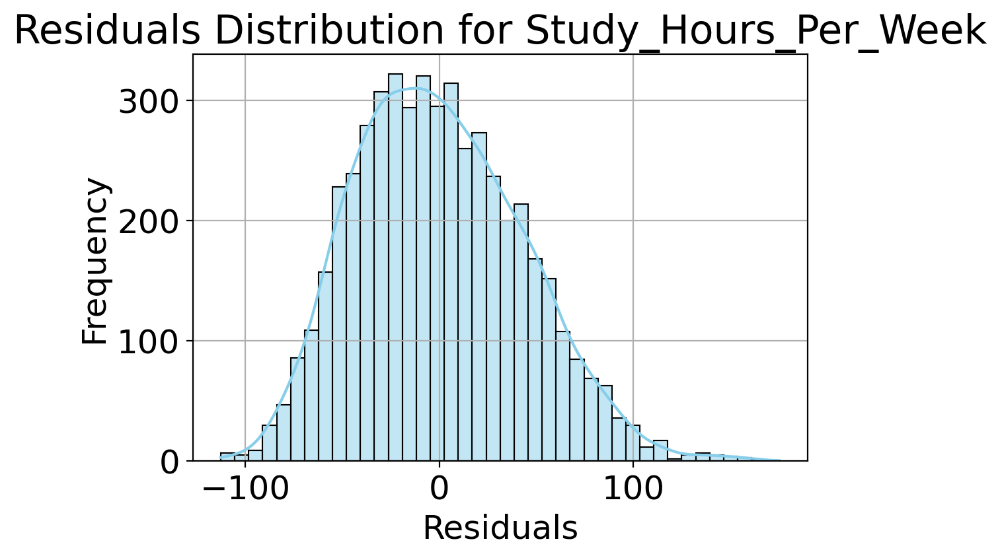

Attendance_Rate: Skewness = 0.41


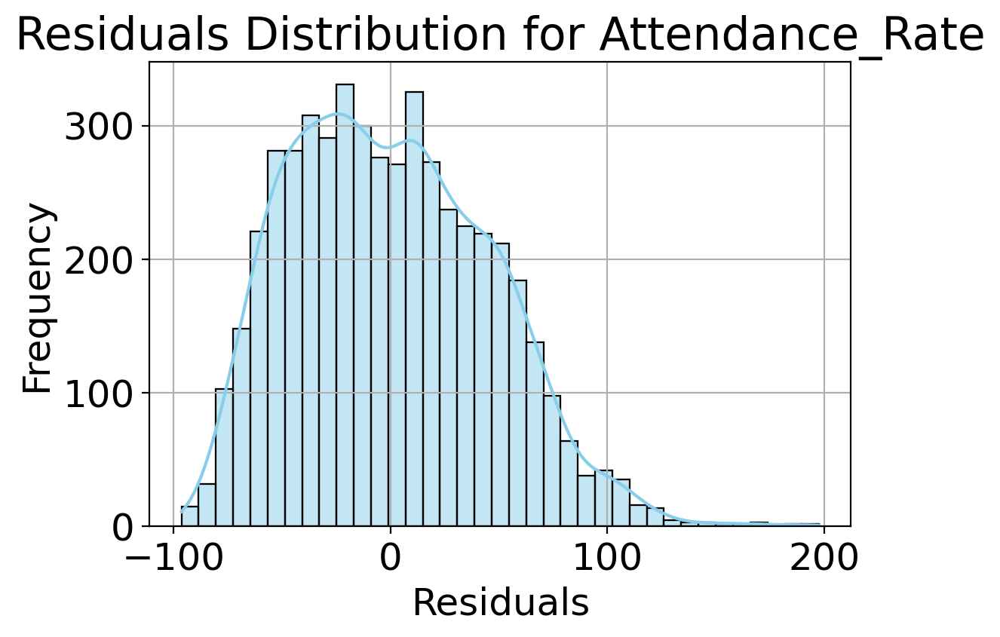

Teacher_Quality: Skewness = 0.46


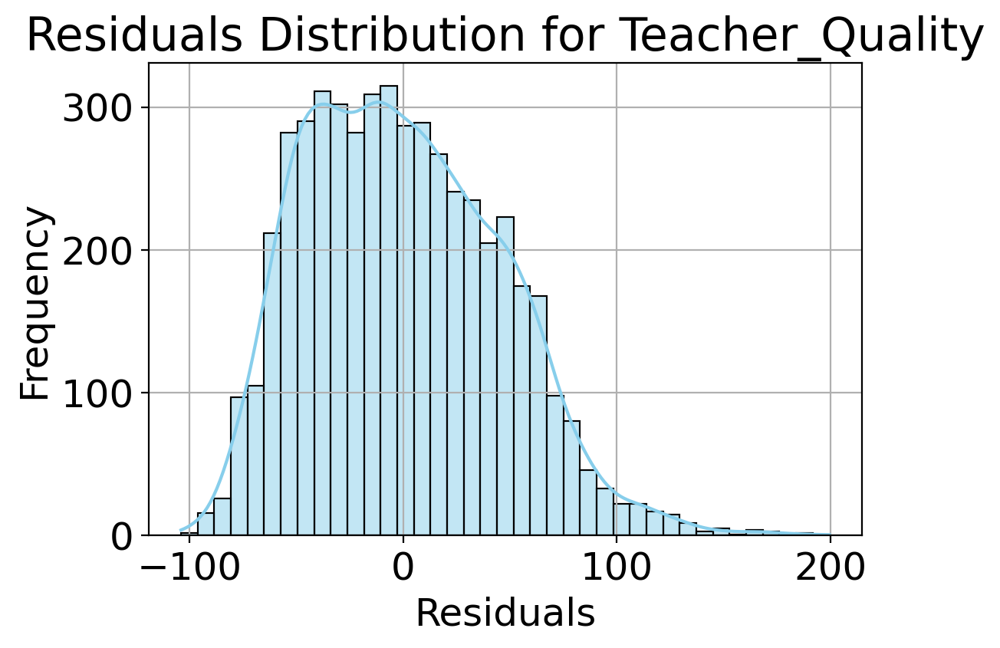

Distance_To_School: Skewness = 0.48


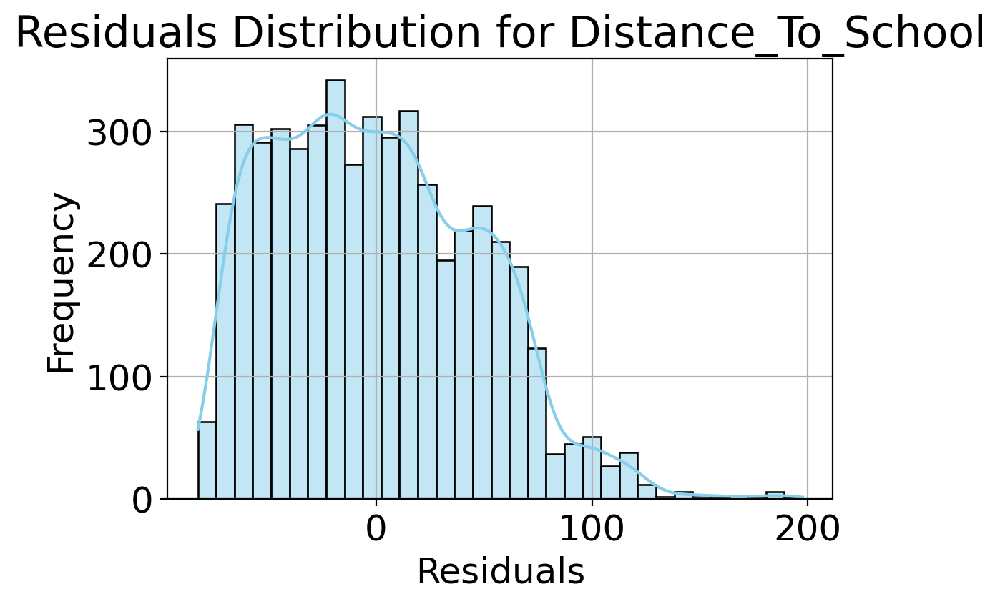

Assignments_Completed: Skewness = 0.43


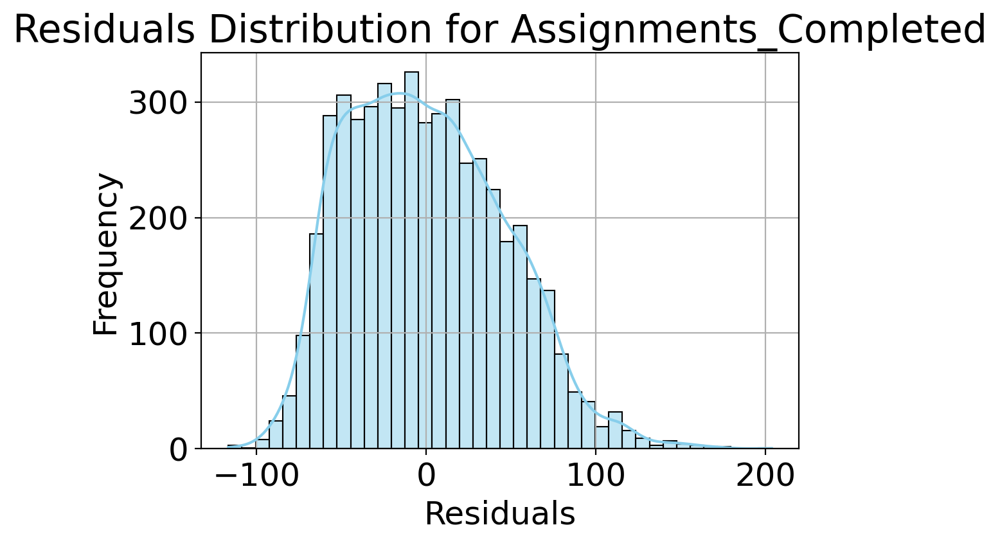

Interaction_StudyHours_ParentInvolvement: Skewness = 0.50


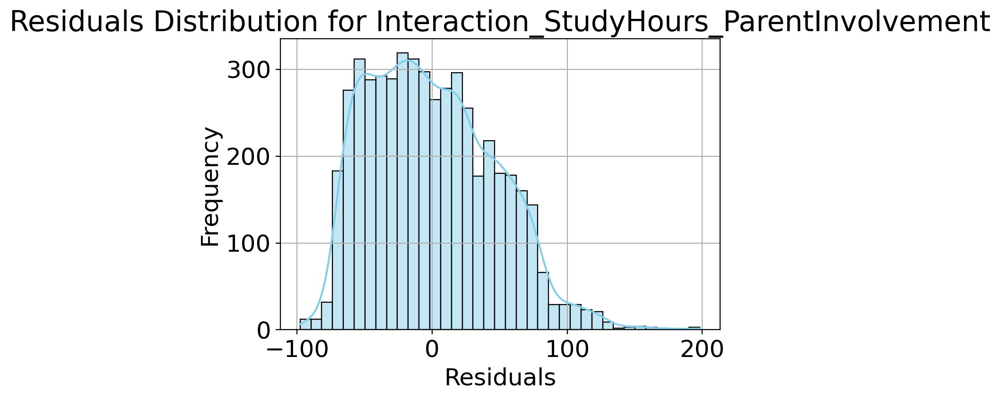

Interaction_Attendance_Socioeconomic: Skewness = 0.46


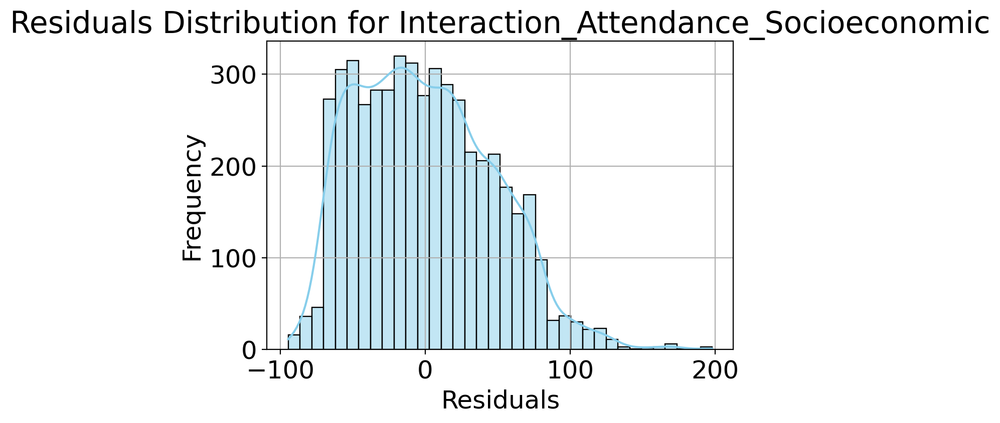

Interaction_Teacher_ParentEducation: Skewness = 0.47


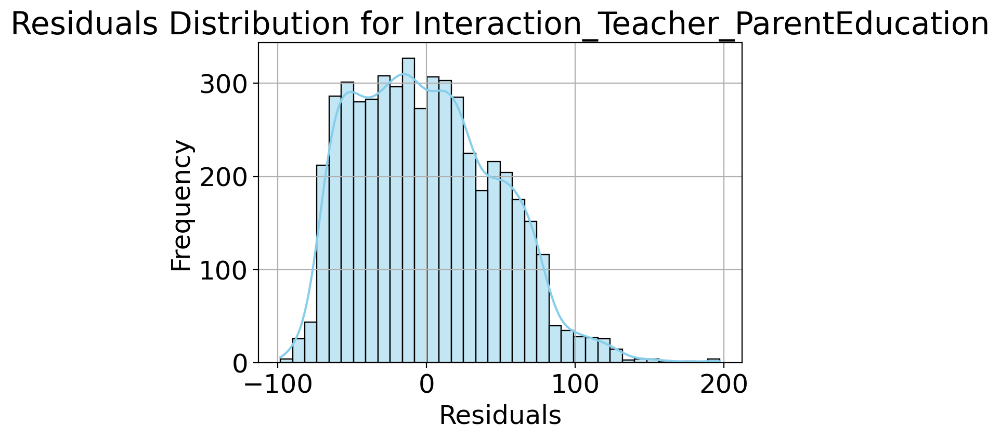

Interaction_StudyHours_Attendance: Skewness = 0.34


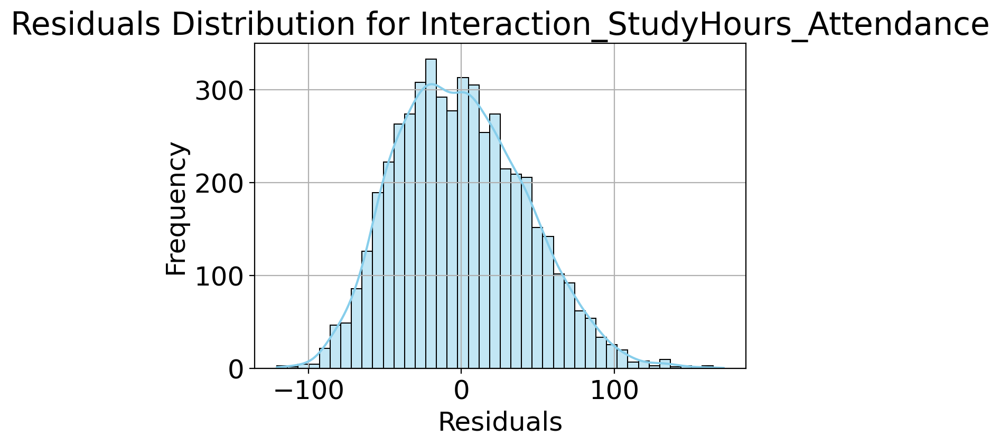

In [50]:
def calculate_residuals(x, y):
    x = x.reshape(-1, 1)
    model = LinearRegression()
    model.fit(x, y)
    predictions = model.predict(x)
    residuals = y - predictions
    return residuals

def plot_residuals_and_skew(variable_name, residuals):
    plt.figure(figsize=(6, 4))
    sns.histplot(residuals, kde=True, color='skyblue')
    plt.title(f'Residuals Distribution for {variable_name}')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.grid(True)

    skewness_value = skew(residuals)
    print(f'{variable_name}: Skewness = {skewness_value:.2f}')
    
    plt.show()

variables = [
    'Study_Hours_Per_Week', 'Attendance_Rate', 'Teacher_Quality',
    'Distance_To_School','Assignments_Completed', 'Interaction_StudyHours_ParentInvolvement', 'Interaction_Attendance_Socioeconomic',
    'Interaction_Teacher_ParentEducation', 'Interaction_StudyHours_Attendance'
]

y = df.JAMB_Score.values

for var in variables:
    x = A[var].values  
    residuals = calculate_residuals(x, y) 
    plot_residuals_and_skew(var, residuals)


**PCA and OLS comparison, Model Selection**

In [14]:
A['JAMB_Score'] = df['JAMB_Score']
A = A.drop(['Age'], axis=1)

In [15]:
xx = pd.DataFrame(scale(A), index=A.index, columns=A.columns)

In [16]:
pca_loadings = pd.DataFrame(PCA().fit(xx).components_.T, index=A.columns)

In [54]:
pca_loadings 

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
Study_Hours_Per_Week,0.401582,-0.285679,-0.046854,0.055816,-0.102307,-0.009482,-0.226571,-0.034032,-0.202787,-0.035016,...,0.006894,0.410681,0.098934,-0.003745,0.387864,-0.557881,6.791525e-16,2.022541e-16,6.334755e-16,2.956158e-16
Attendance_Rate,0.187018,-0.070304,0.017821,-0.008682,0.010754,0.005507,-0.057047,0.017406,0.532411,-0.011542,...,-0.289174,-0.092760,-0.020742,0.001493,0.119855,-0.102142,1.079618e-16,6.549701e-17,1.754098e-16,1.090653e-16
Teacher_Quality,0.163111,0.002816,0.021939,-0.013473,-0.002545,-0.015652,0.041809,0.323911,0.403108,0.561828,...,-0.380102,0.061408,-0.011421,-0.152618,-0.001795,-0.000991,-1.593796e-16,9.415779e-18,1.410204e-16,-2.613148e-17
Distance_To_School,-0.037127,0.013261,0.031139,-0.007274,-0.012986,0.001532,0.012446,0.007451,-0.477761,0.767018,...,0.119474,-0.036437,-0.008334,-0.001067,-0.001932,-0.000099,-6.619996e-17,-1.788490e-17,-6.113753e-17,4.736145e-17
Assignments_Completed,0.309397,-0.223677,-0.053990,0.071924,-0.090549,-0.003888,-0.230399,-0.037459,-0.267723,-0.067208,...,-0.283109,-0.781149,-0.014083,0.002674,-0.000593,-0.000123,3.458634e-17,3.658384e-17,9.543531e-17,9.210371e-18
Parent_Involvement_High,0.160214,-0.125708,-0.003028,-0.000331,-0.029981,0.180542,0.662130,0.009800,-0.059127,-0.042787,...,-0.050578,-0.068815,0.687637,-0.008228,-0.004993,-0.000106,1.555154e-17,3.133543e-17,1.659463e-16,-2.659942e-16
Socioeconomic_Status_High,0.267914,0.420206,0.026598,0.009611,0.046569,0.038479,0.017894,-0.482728,0.017425,0.076724,...,-0.056980,0.018521,0.008048,-0.002271,0.576610,0.405451,4.337467e-16,5.243291e-16,-5.172421e-16,2.891208e-16
Parent_Education_Level_Tertiary,0.233787,0.428376,-0.014140,-0.003345,0.008647,0.031209,-0.018328,0.421431,-0.204246,-0.206556,...,0.050235,-0.000139,-0.013506,-0.690921,-0.009383,-0.006171,1.502833e-16,-1.026754e-16,1.840131e-16,-1.811504e-17
Extra_Tutorials_No,-0.044158,0.000158,-0.482943,-0.098820,0.107195,0.478024,-0.107740,-0.002594,0.034426,0.039726,...,0.025234,0.000451,-0.001338,-0.001587,-0.000372,0.000904,-3.311130e-02,-3.389657e-02,-1.036066e-02,7.054412e-01
Extra_Tutorials_Yes,0.044158,-0.000158,0.482943,0.098820,-0.107195,-0.478024,0.107740,0.002594,-0.034426,-0.039726,...,-0.025234,-0.000451,0.001338,0.001587,0.000372,-0.000904,-3.311130e-02,-3.389657e-02,-1.036066e-02,7.054412e-01


In [17]:
pca = PCA()
A_plot = pd.DataFrame(pca.fit_transform(xx), index=xx.index)
A_plot.describe()

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
count,5.000000e+03,5.000000e+03,5000.000000,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,...,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03,5.000000e+03
mean,-1.847411e-17,-3.268497e-17,0.000000,-7.105427e-18,1.023182e-16,4.973799e-17,3.694822e-17,-1.705303e-17,-1.598721e-17,-2.700062e-17,...,2.415845e-17,1.811884e-17,6.039613e-18,-1.101341e-16,1.003642e-17,3.206324e-17,-5.914880e-17,1.643947e-17,6.329919e-17,8.178413e-18
std,1.838132e+00,1.562014e+00,1.445454,1.415228e+00,1.402742e+00,1.388950e+00,1.314192e+00,1.134480e+00,1.046594e+00,9.969853e-01,...,7.447869e-01,6.846322e-01,3.007782e-01,2.520543e-01,8.058399e-02,7.184093e-02,1.102858e-15,1.019245e-15,8.187603e-16,4.600954e-16
min,-4.139499e+00,-4.158515e+00,-2.623892,-2.449946e+00,-2.532072e+00,-2.024591e+00,-2.908933e+00,-3.135529e+00,-3.528492e+00,-3.039502e+00,...,-2.928177e+00,-2.655494e+00,-1.050712e+00,-7.946487e-01,-3.478710e-01,-4.050173e-01,-5.166837e-14,-6.321969e-15,-1.308041e-15,-1.441600e-15
25%,-1.384185e+00,-1.078129e+00,-1.348188,-1.198686e+00,-1.032755e+00,-1.541433e+00,-9.050122e-01,-3.938446e-01,-7.210361e-01,-7.206379e-01,...,-5.062484e-01,-4.710235e-01,-1.585676e-01,-6.991586e-02,-2.983992e-02,-3.113941e-02,-1.268597e-16,-3.950942e-17,-1.645283e-18,-2.533619e-17
50%,-1.571760e-01,-2.095920e-01,0.080223,-5.005585e-01,-4.490648e-01,1.747612e-01,-3.050184e-01,-2.070222e-02,6.710175e-03,-5.115216e-03,...,-1.707712e-02,1.658915e-02,-2.125927e-02,7.286803e-02,3.494599e-03,-3.951660e-03,-5.754634e-17,7.786758e-18,4.907503e-17,4.983898e-18
75%,1.129976e+00,8.575968e-01,0.966147,1.429881e+00,9.356435e-01,6.894313e-01,5.487094e-01,3.565428e-01,7.232312e-01,6.719560e-01,...,4.852912e-01,4.780724e-01,1.234459e-01,1.090882e-01,3.078465e-02,2.769258e-02,9.531257e-18,5.144605e-17,9.831536e-17,3.299242e-17
max,7.021821e+00,5.093240e+00,3.312149,2.776029e+00,3.747851e+00,3.670610e+00,3.160559e+00,4.067368e+00,3.649042e+00,3.253758e+00,...,3.295299e+00,2.675237e+00,1.341652e+00,1.011131e+00,5.826768e-01,7.105981e-01,5.700089e-14,7.142016e-14,4.247963e-14,3.222919e-14


In [56]:
A_plot

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,2.087673,0.900034,0.146183,-0.976133,-1.418313,-0.811145,2.540802,3.015675,-1.035113,0.315868,...,-0.272729,0.010827,0.003347,0.518248,-0.003633,-0.037603,-8.047148e-16,-7.541413e-16,-7.968746e-16,-1.114309e-16
1,1.080969,1.267686,-1.996109,1.207827,0.402832,0.862188,2.381239,-1.777404,2.401821,0.321355,...,-0.384610,0.158554,0.480970,-0.166824,-0.015010,-0.041269,5.769767e-16,-1.511018e-15,-1.162337e-15,8.037754e-17
2,3.564670,1.611127,-0.316653,1.857124,-0.483980,-0.650482,2.672087,-0.792703,-1.021061,-0.845114,...,-0.314095,0.646348,-0.356147,-0.285844,-0.022805,-0.010539,-3.576651e-16,2.975270e-16,-6.215356e-16,1.223275e-16
3,1.404243,0.362528,-1.845819,-1.326625,-0.858047,0.240678,-1.271225,1.562858,1.173512,-1.819160,...,0.549956,1.246635,0.148868,-0.352593,-0.011262,0.120956,-1.915466e-16,1.516170e-16,-1.131783e-15,-4.609764e-16
4,0.086477,1.814477,-1.638377,-1.551784,-0.503127,0.290907,-0.371359,2.408103,1.244918,-0.224748,...,0.223434,-0.107294,-0.201823,0.080478,0.101793,-0.042663,5.818665e-16,-5.157779e-16,3.025056e-16,-6.770548e-16
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,-1.101237,-0.574982,2.145719,-0.336224,-1.670412,0.284807,-0.783164,-0.170161,-0.573254,-0.127223,...,0.742545,-0.225485,-0.002657,0.095002,-0.027769,-0.040295,-1.850899e-18,1.046001e-16,9.035729e-17,-2.625934e-17
4996,-3.015763,0.765829,-1.943018,0.999402,0.564132,0.059342,0.523594,-0.004842,-0.245449,1.795688,...,1.164388,-0.995193,-0.398690,0.098348,-0.050979,0.046192,-5.413362e-17,2.201489e-17,9.263440e-17,1.702232e-17
4997,-0.037566,-0.975016,0.252210,-0.707275,-1.308239,2.156040,-1.433882,0.248260,1.109460,0.852592,...,1.054202,-1.623400,-0.123649,-0.053544,0.027968,-0.004622,-2.370827e-17,4.409537e-17,-6.048124e-20,1.251036e-17
4998,-1.523632,-0.316337,-0.119871,1.789597,-0.184914,2.097239,-0.845144,0.003353,0.717785,1.002963,...,0.630095,0.117367,-0.117812,0.088073,0.068621,-0.008545,-5.386741e-17,-9.139257e-17,-6.167642e-18,-9.624766e-18


In [79]:
print(pca.explained_variance_)

print(pca.explained_variance_ratio_)

[3.04380296 2.41790609 2.08855828 2.0028645  1.96747976 1.92816147]
[0.15215971 0.12087113 0.10440703 0.1001232  0.09835431 0.09638879]


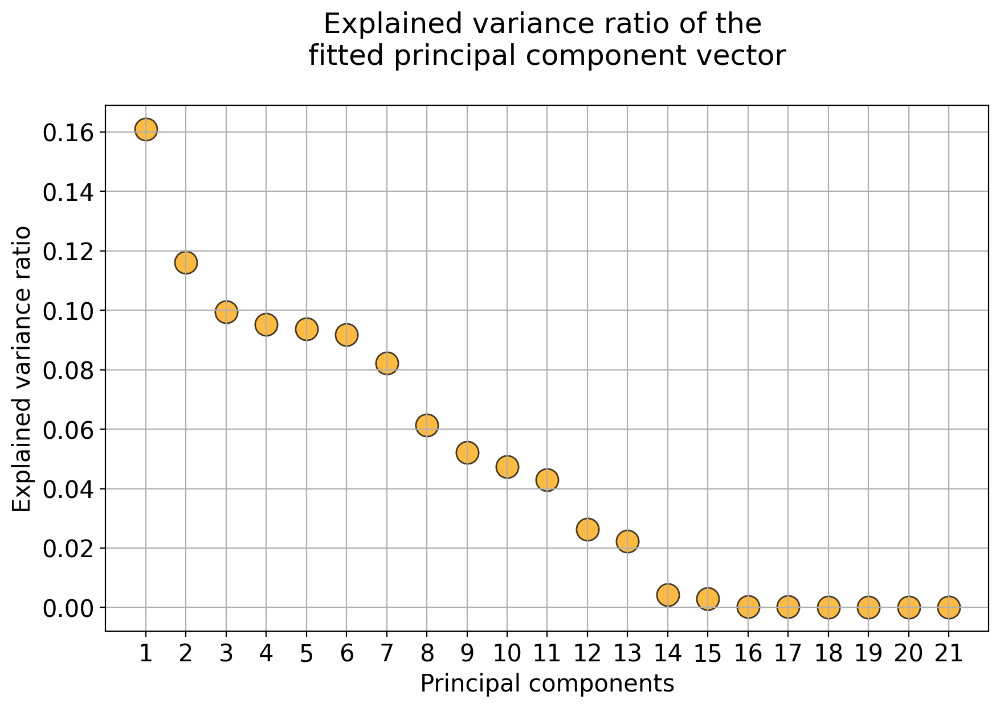

In [58]:
plt.figure(figsize=(10,6))
plt.scatter(x=[i+1 for i in range(len(pca.explained_variance_ratio_))],
            y=pca.explained_variance_ratio_,
           s=200, alpha=0.75,c='orange',edgecolor='k')
plt.grid(True)
plt.title("Explained variance ratio of the \nfitted principal component vector\n",fontsize=18)
plt.xlabel("Principal components",fontsize=15)
plt.xticks([i+1 for i in range(len(pca.explained_variance_ratio_))],fontsize=15)
plt.yticks(fontsize=15)
plt.ylabel("Explained variance ratio",fontsize=15)
plt.show()

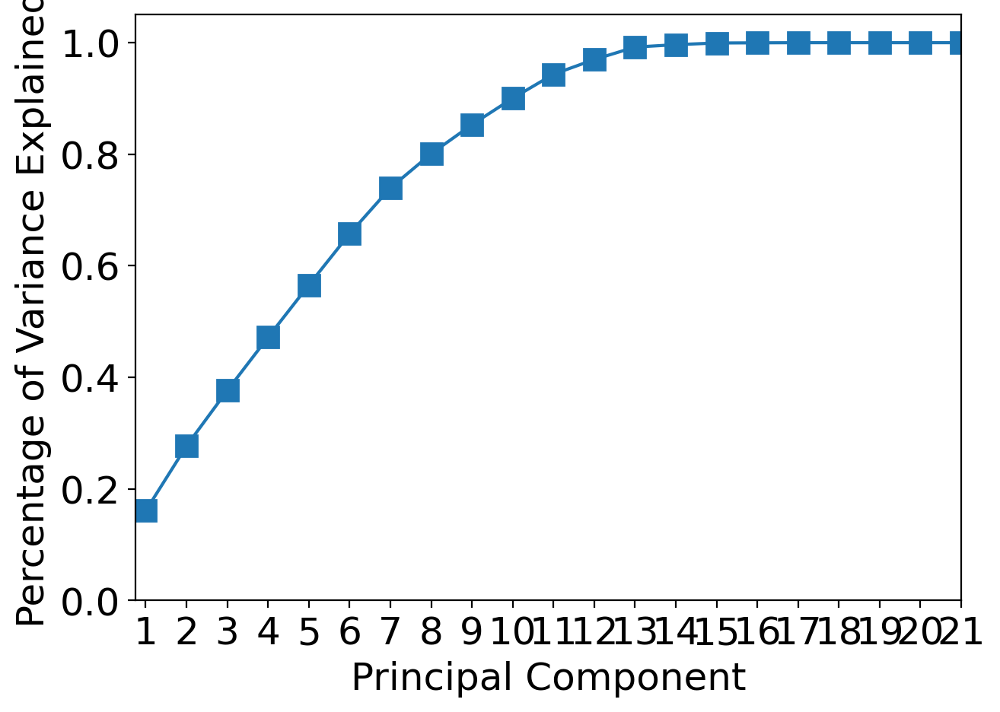

In [59]:
plt.figure(figsize=(7,5))
plt.plot([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21], np.cumsum(pca.explained_variance_ratio_), '-s')
plt.ylabel('Percentage of Variance Explained')
plt.xlabel('Principal Component')
plt.xlim(0.75,4.25)
plt.ylim(0,1.05)
plt.xticks([1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21])
plt.show()

In [60]:
from pca import pca

A_plot = pca(n_components=8, normalize=True)
A_plot

In [61]:
out = A_plot.fit_transform(A)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >Normalizing input data per feature (zero mean and unit variance)..
[pca] >The PCA reduction is performed on the [21] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[8]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


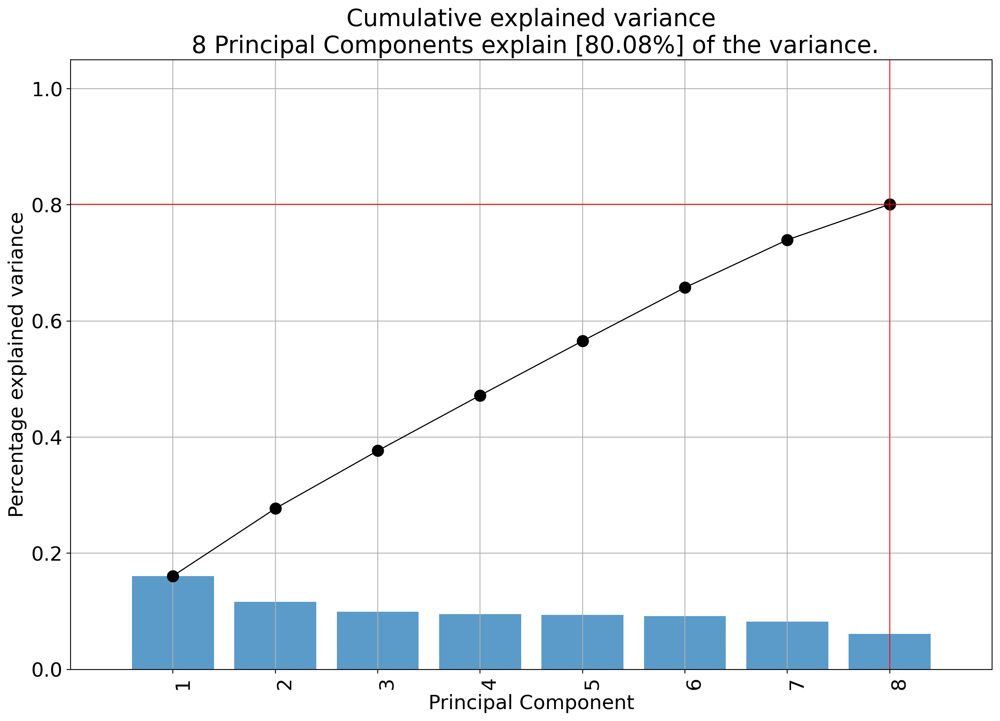

In [62]:
fig, ax = A_plot.plot()

plt.show()

In [18]:
A_d = A.drop(['JAMB_Score'], axis=1)

A_d

,Study_Hours_Per_Week,Attendance_Rate,Teacher_Quality,Distance_To_School,Assignments_Completed,Parent_Involvement_High,Socioeconomic_Status_High,Parent_Education_Level_Tertiary,Extra_Tutorials_No,Extra_Tutorials_Yes,School_Type_Private,School_Type_Public,School_Location_Rural,School_Location_Urban,Access_To_Learning_Materials_Yes,Access_To_Learning_Materials_No,Interaction_StudyHours_ParentInvolvement,Interaction_Attendance_Socioeconomic,Interaction_Teacher_ParentEducation,Interaction_StudyHours_Attendance
0,22,78,4,12.4,2,1,0,1,0,1,0,1,0,1,1,0,22,0,4,1716
1,14,88,4,2.7,1,1,1,0,1,0,0,1,1,0,1,0,14,88,0,1232
2,29,87,2,9.6,2,1,1,1,0,1,0,1,1,0,1,0,29,87,2,2523
3,29,99,2,2.6,1,0,0,1,1,0,0,1,0,1,1,0,0,0,2,2871
4,12,98,3,8.8,1,0,0,1,1,0,0,1,0,1,1,0,0,0,3,1176
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,20,74,2,10.6,2,0,0,0,0,1,0,1,0,1,0,1,0,0,0,1480
4996,0,80,2,20.0,1,0,0,0,1,0,0,1,1,0,1,0,0,0,0,0
4997,17,89,3,11.3,3,0,0,0,1,0,0,1,0,1,0,1,0,0,0,1513
4998,15,96,2,15.9,1,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1440


In [19]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
xx = scaler.fit_transform(A.drop(['JAMB_Score'], axis=1))

pca = PCA(n_components=8)
X_pca = pca.fit_transform(xx)

pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(8)])

pca_df2 = pca_df.copy()

pca_df['JAMB_Score'] = A['JAMB_Score'].values

pca_df2.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8
0,2.144090,0.679065,0.157670,-0.975848,-1.420741,-0.853422,2.539770,3.091797
1,0.982118,1.214596,-2.011277,1.209883,0.411321,0.904497,2.382729,-1.932567
2,3.907680,1.121493,-0.265487,1.853827,-0.501923,-0.717133,2.669566,-0.662478
3,1.233135,0.270306,-1.849643,-1.324417,-0.854205,0.244753,-1.270680,1.512917
4,0.046206,1.881854,-1.682600,-1.547024,-0.482637,0.337429,-0.369499,2.308222


In [20]:
X_original = A.drop(['JAMB_Score'], axis=1)
Y = A['JAMB_Score']

X_train_orig, X_test_orig, Y_train, Y_test = train_test_split(X_original, Y, test_size=0.3, random_state=42)

X_train_pca, X_test_pca, Y_train_pca, Y_test_pca = train_test_split(pca_df2, Y, test_size=0.3, random_state=42)

print(X_train_orig.shape, X_test_orig.shape, X_train_pca.shape, X_test_pca.shape)


(3500, 20) (1500, 20) (3500, 8) (1500, 8)


In [24]:
lin_reg_orig = LinearRegression()
lin_reg_orig.fit(X_train_orig, Y_train)

lin_reg_pca = LinearRegression()
lin_reg_pca.fit(X_train_pca, Y_train_pca)

Y_pred_orig = lin_reg_orig.predict(X_test_orig)
Y_pred_pca = lin_reg_pca.predict(X_test_pca)

orig_rmse = np.sqrt(mean_squared_error(Y_test, Y_pred_orig))
orig_r2 = r2_score(Y_test, Y_pred_orig)

pca_rmse = np.sqrt(mean_squared_error(Y_test_pca, Y_pred_pca))
pca_r2 = r2_score(Y_test_pca, Y_pred_pca)

print(f"Original Dataset - RMSE: {orig_rmse}, R^2: {orig_r2}")
print(f"PCA Dataset - RMSE: {pca_rmse}, R^2: {pca_r2}")

Original Dataset - RMSE: 39.354828913132636, R^2: 0.3466279143901969
PCA Dataset - RMSE: 40.9564474794509, R^2: 0.2923653716033059


In [25]:
cv_scores = cross_val_score(lin_reg_pca, X_train_pca, Y_train_pca, cv=10, scoring='neg_mean_squared_error')

cv_rmse = np.sqrt(-cv_scores.mean())
print(f"Cross-validated RMSE for PCA dataset: {cv_rmse}")

Cross-validated RMSE for PCA dataset: 40.34332725524195


In [26]:
n_iterations = 1000 
rmse_list = []
r2_list = []

for _ in range(n_iterations):
    X_bs, y_bs = resample(X_pca, y)
    
    model = LinearRegression().fit(X_bs, y_bs)
    
    y_pred = model.predict(X_pca)
    
    rmse = np.sqrt(mean_squared_error(y, y_pred))
    r2 = r2_score(y, y_pred)
    
    rmse_list.append(rmse)
    r2_list.append(r2)

mean_rmse = np.mean(rmse_list)
std_rmse = np.std(rmse_list)
mean_r2 = np.mean(r2_list)
std_r2 = np.std(r2_list)

print(f"Mean RMSE: {mean_rmse}, Std RMSE: {std_rmse}")
print(f"Mean R²: {mean_r2}, Std R²: {std_r2}")

Mean RMSE: 40.451137975526805, Std RMSE: 0.01772097029755115
Mean R²: 0.278171684072536, Std R²: 0.0006325786636649157


In [27]:

def pca_ols_performance(X_scaled, y, n_components):

    xx = scaler.fit_transform(X_scaled)

    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(xx)
    
    X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=42)
    
    model = LinearRegression()
    model.fit(X_train, y_train)
    
    y_pred = model.predict(X_test)
    
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    
    rss = np.sum((y_test - y_pred) ** 2)
    
    k = X_train.shape[1] + 1  
    
    aic = n * np.log(rss / n) + 2 * k
    bic = n * np.log(rss / n) + k * np.log(n)
    
    return rmse, r2, aic, bic

components_list = [4, 5, 6, 7, 8]
rmse_list = []
r2_list = []
aic_list = []
bic_list = []
y = pca_df['JAMB_Score']

for n in components_list:
    rmse, r2, aic, bic = pca_ols_performance(A_d, y, n)
    rmse_list.append(rmse)
    r2_list.append(r2)
    aic_list.append(aic)
    bic_list.append(bic)

for i in range(len(components_list)):
    print(f"Components: {components_list[i]}, RMSE: {rmse_list[i]}, R²: {r2_list[i]}, AIC: {aic_list[i]}, BIC: {bic_list[i]}")


Components: 4, RMSE: 41.07110861768044, R²: 0.2883976559611058, AIC: 11155.914762920598, BIC: 11182.48086485605
Components: 5, RMSE: 41.06163786430017, R²: 0.28872580065931586, AIC: 11157.222900990157, BIC: 11189.102223312699
Components: 6, RMSE: 41.013571794164875, R²: 0.290390037513228, AIC: 11155.709093898075, BIC: 11192.901636607707
Components: 7, RMSE: 41.01541249358644, R²: 0.2903263411365822, AIC: 11157.843731631641, BIC: 11200.349494728363
Components: 8, RMSE: 40.9564474794509, R²: 0.2923653716033059, AIC: 11155.527736533431, BIC: 11203.346720017244


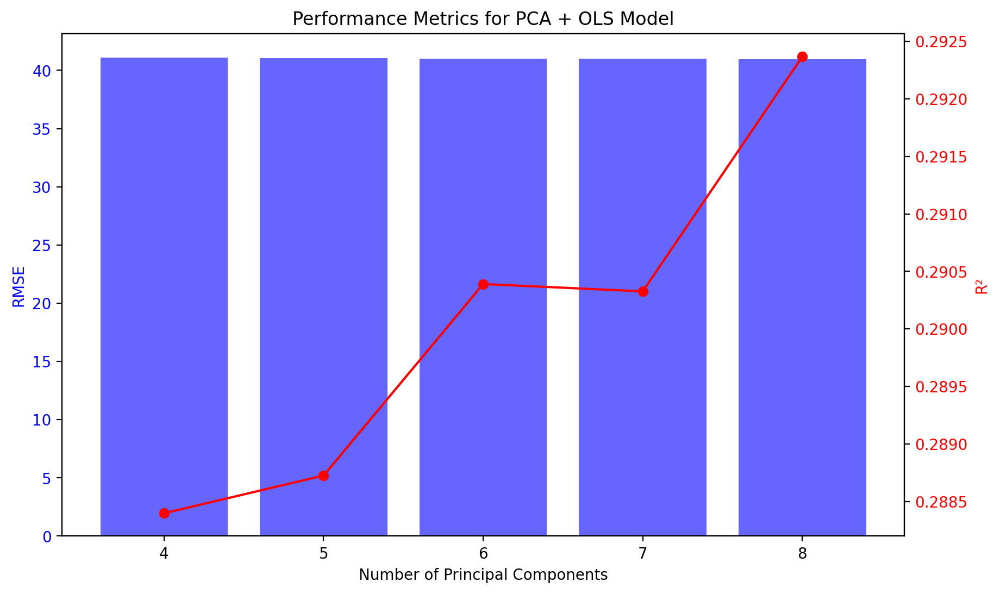

In [28]:
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.bar(components_list, rmse_list, color='blue', alpha=0.6)
ax1.set_xlabel('Number of Principal Components')
ax1.set_ylabel('RMSE', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()
ax2.plot(components_list, r2_list, color='red', marker='o', label='R²')
ax2.set_ylabel('R²', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('Performance Metrics for PCA + OLS Model')
plt.show()


In [29]:
X = A.drop(['JAMB_Score'], axis=1)
y = A['JAMB_Score']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

In [30]:
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

rf_model.fit(X_train, y_train)

y_pred_rf = rf_model.predict(X_test)

rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest RMSE: {rmse_rf}")
print(f"Random Forest R²: {r2_rf}")

Random Forest RMSE: 41.31840093624546
Random Forest R²: 0.2798026325785634


In [73]:
def pca_ols_performance(X_scaled, y, n_components):
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_scaled)
    
    X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, test_size=0.3, random_state=42)
    
    ols_model = LinearRegression()
    ols_model.fit(X_train_pca, y_train_pca)
    
    y_pred_ols = ols_model.predict(X_test_pca)
    
    rmse_ols = np.sqrt(mean_squared_error(y_test_pca, y_pred_ols))
    r2_ols = r2_score(y_test_pca, y_pred_ols)
    
    return rmse_ols, r2_ols

rmse_ols_6, r2_ols_6 = pca_ols_performance(X_scaled, y, 6)

print(f"PCA + OLS (6 Components) RMSE: {rmse_ols_6}")
print(f"PCA + OLS (6 Components) R²: {r2_ols_6}")

PCA + OLS (6 Components) RMSE: 41.013571794164875
PCA + OLS (6 Components) R²: 0.290390037513228


In [74]:
pca = PCA(n_components=6)
X_pca = pca.fit_transform(X_scaled)

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(X_pca, y, test_size=0.3, random_state=42)

ols_model = LinearRegression()
ols_model.fit(X_train_pca, y_train_pca)

LinearRegression()

**Random Forest**

In [75]:
print(f"Comparison of Models:")
print(f"Random Forest RMSE: {rmse_rf}, R²: {r2_rf}")
print(f"PCA + OLS (6 Components) RMSE: {rmse_ols_6}, R²: {r2_ols_6}")


Comparison of Models:
Random Forest RMSE: 41.31840093624546, R²: 0.2798026325785634
PCA + OLS (6 Components) RMSE: 41.013571794164875, R²: 0.290390037513228


In [32]:
cv_scores_rf = cross_val_score(rf_model, X_scaled, y, cv=5, scoring='neg_mean_squared_error')
cv_rmse_rf = np.sqrt(-cv_scores_rf.mean())
print(f"Cross-validated RMSE for Random Forest: {cv_rmse_rf}")

pca = PCA(n_components=6)
X_pca = pca.fit_transform(X_scaled)

X_train, X_test, y_train, y_test = train_test_split(X_pca, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(X_train, y_train)

y_pred = model.predict(X_test)

cv_scores_ols = cross_val_score(LinearRegression(), X_pca, y, cv=5, scoring='neg_mean_squared_error')
cv_rmse_ols = np.sqrt(-cv_scores_ols.mean())
print(f"Cross-validated RMSE for PCA + OLS: {cv_rmse_ols}")


Cross-validated RMSE for Random Forest: 40.742932687841346
Cross-validated RMSE for PCA + OLS: 40.49932490669365


In [33]:
y = A['JAMB_Score']

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)


In [34]:
regr_tree_jamb = DecisionTreeRegressor(max_depth = 2)
 
regr_tree_jamb.fit(X_train, y_train)

DecisionTreeRegressor(max_depth=2)

In [35]:
bagged_jamb = RandomForestRegressor(max_features = 10, random_state = 1)
bagged_jamb.fit(X_train, y_train)

RandomForestRegressor(max_features=10, random_state=1)

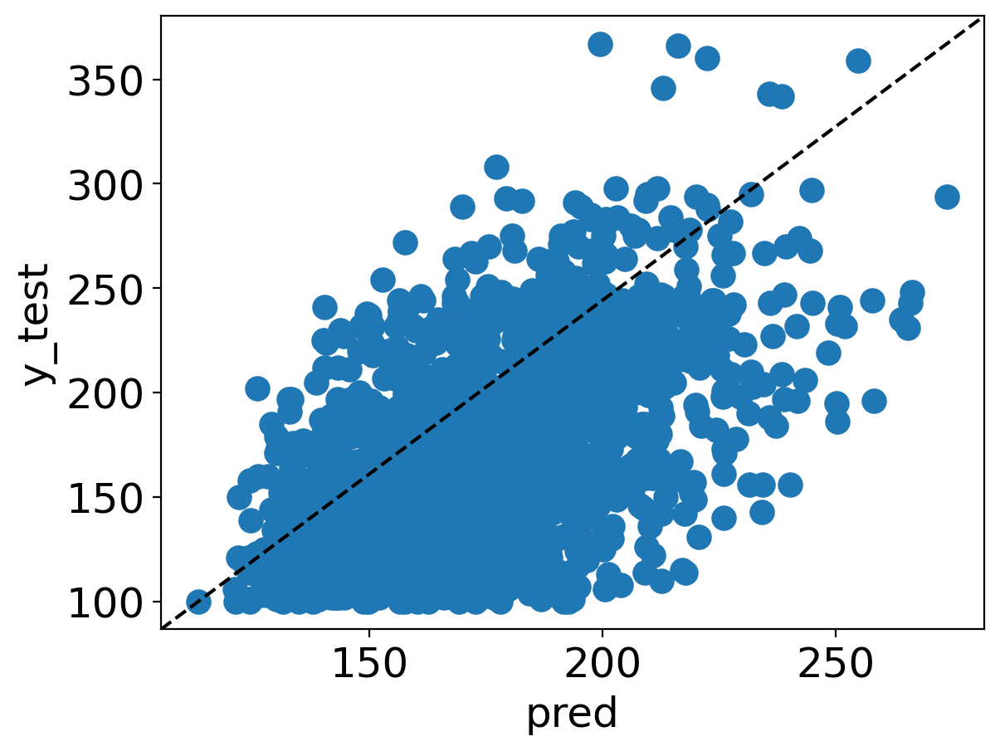

In [80]:
pred = bagged_jamb.predict(X_test)

plt.scatter(pred, 
            y_test, 
            label = 'medv') 

plt.plot([0, 1], 
         [0, 1], 
         '--k',  #with dashed lines
         transform = plt.gca().transAxes) 

plt.xlabel('pred')
plt.ylabel('y_test')
plt.show()

In [81]:
np.sqrt(mean_squared_error(y_test, pred))

41.346896175673585

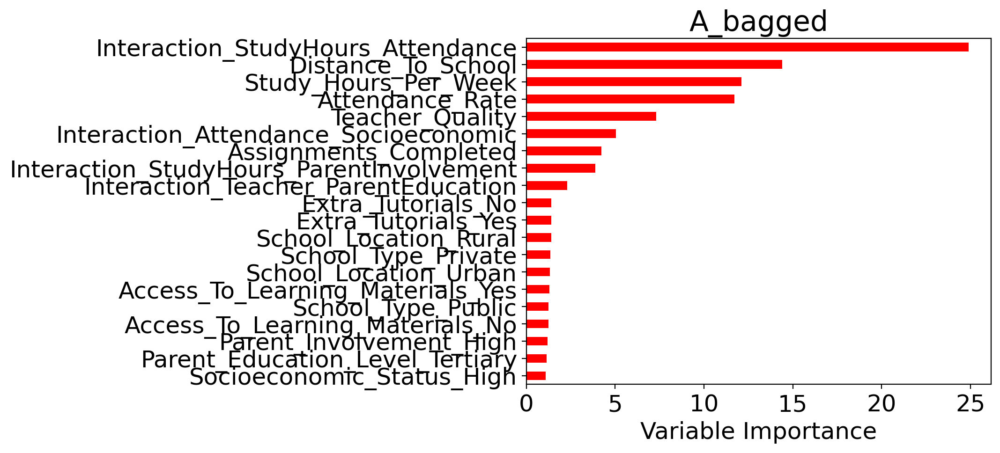

In [82]:
feature_importance = bagged_jamb.feature_importances_*100

rel_imp = pd.Series(feature_importance, 
                    index = X.columns).sort_values(inplace = False)

rel_imp.T.plot(kind = 'barh', 
               color = 'r', )

plt.xlabel('Variable Importance')

plt.gca().legend_ = None
plt.title("A_bagged")
plt.show()

In [36]:
boosted_jamb = GradientBoostingRegressor(n_estimators = 500,
                                           learning_rate = 0.01, 
                                           max_depth = 4, 
                                           random_state = 1)

boosted_jamb.fit(X_train, y_train)

GradientBoostingRegressor(learning_rate=0.01, max_depth=4, n_estimators=500,
                          random_state=1)

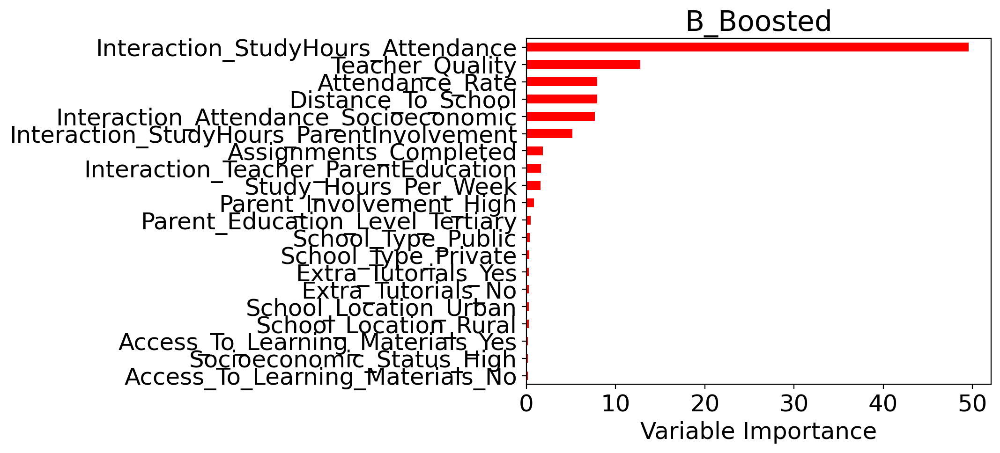

In [84]:
feature_importance = boosted_jamb.feature_importances_*100

rel_imp = pd.Series(feature_importance, 
                    index = X.columns).sort_values(inplace = False)

rel_imp.T.plot(kind = 'barh', 
               color = 'r', )

plt.xlabel('Variable Importance')

plt.gca().legend_ = None
plt.title("B_Boosted")
plt.show()

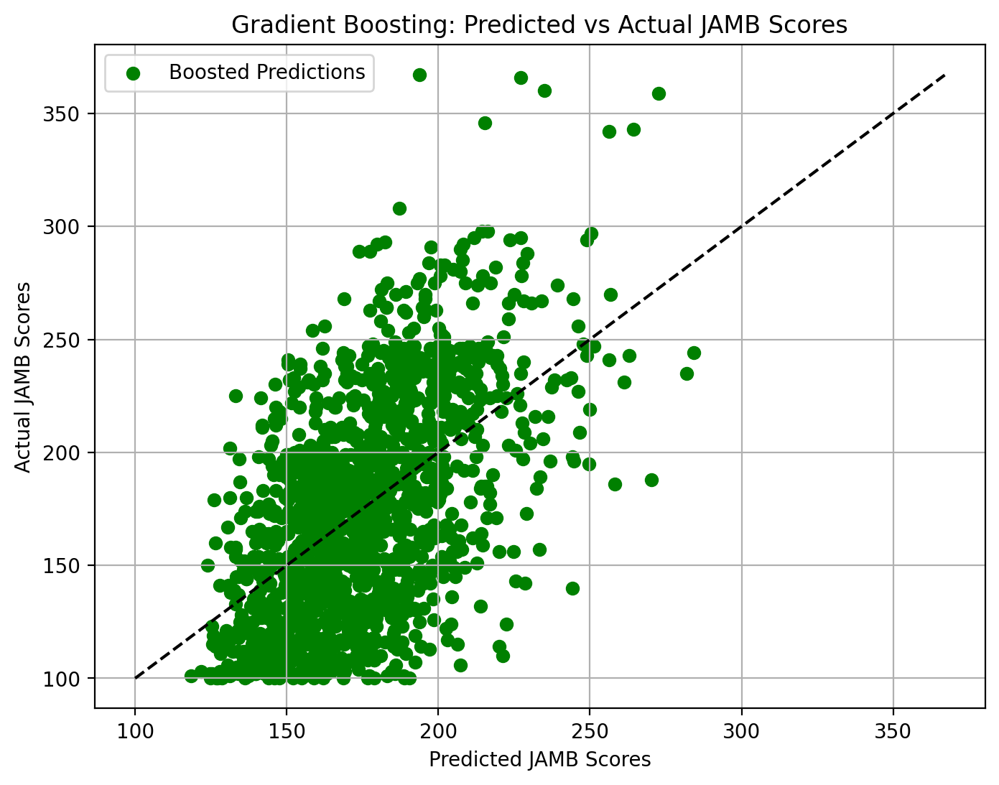

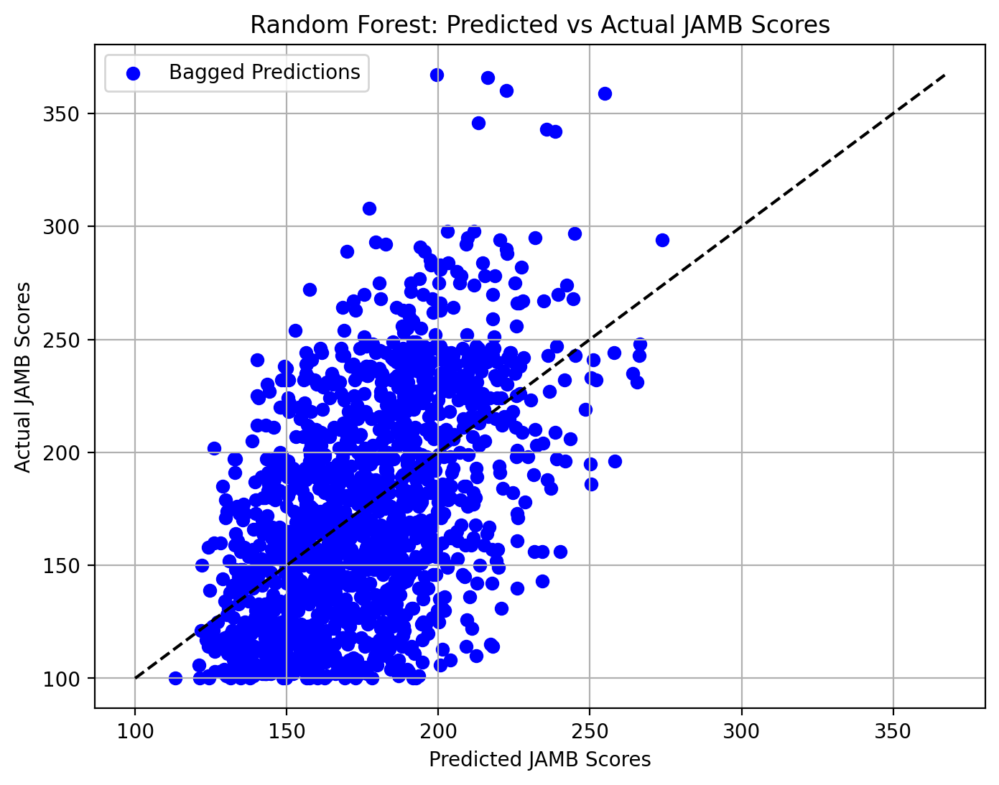

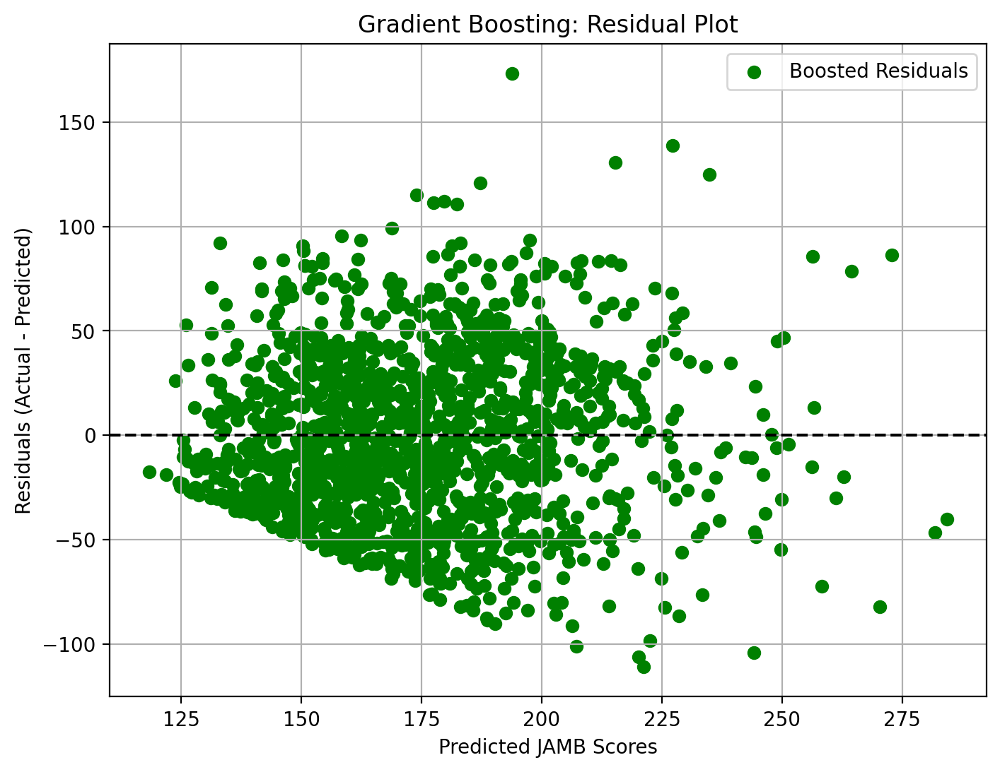

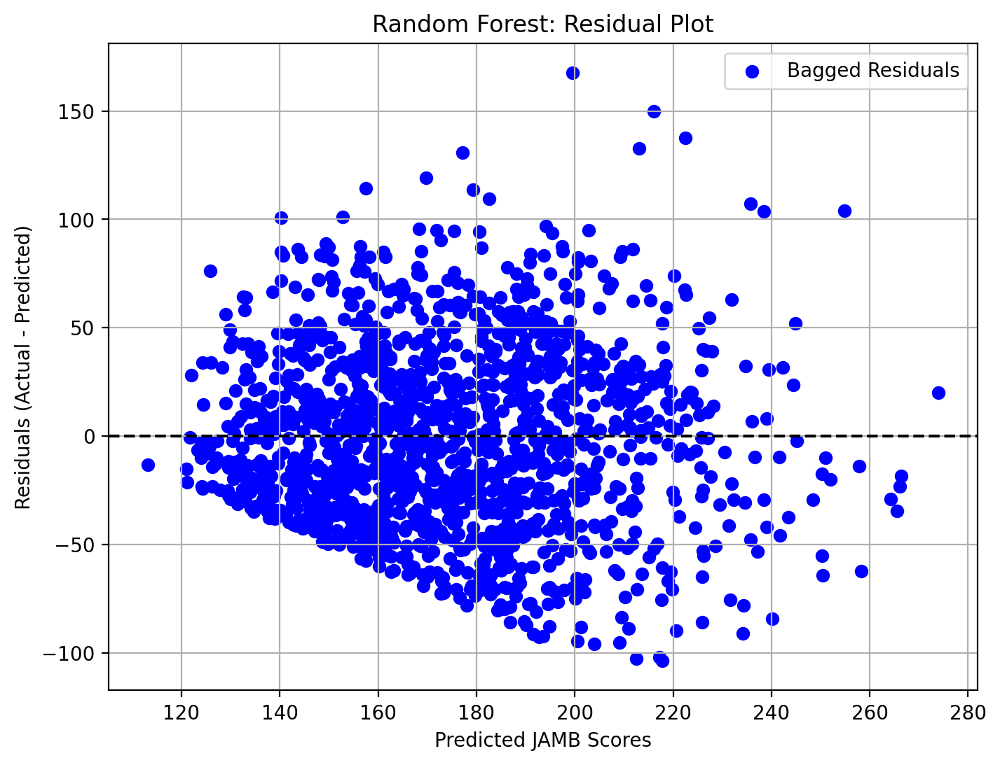

In [37]:
y_pred_boosted = boosted_jamb.predict(X_test)

y_pred_bagged = bagged_jamb.predict(X_test)


plt.figure(figsize=(8, 6))
plt.scatter(y_pred_boosted, y_test, color='green', label='Boosted Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k') 
plt.xlabel('Predicted JAMB Scores')
plt.ylabel('Actual JAMB Scores')
plt.title('Gradient Boosting: Predicted vs Actual JAMB Scores')
plt.legend()
plt.grid(True)
plt.show()


In [38]:
y_pred_bagged = bagged_jamb.predict(X_test)
y_pred_boosted = boosted_jamb.predict(X_test)

rmse_bagged = np.sqrt(mean_squared_error(y_test, y_pred_bagged))

r2_bagged = r2_score(y_test, y_pred_bagged)

print(f"Random Forest RMSE: {rmse_bagged}")
print(f"Random Forest R²: {r2_bagged}")

rmse_boosted = np.sqrt(mean_squared_error(y_test, y_pred_boosted))
r2_boosted = r2_score(y_test, y_pred_boosted)

print(f"Gradient Boosting RMSE: {rmse_boosted}")
print(f"Gradient Boosting R²: {r2_boosted}")

Random Forest RMSE: 41.346896175673585
Random Forest R²: 0.2788089216641799
Gradient Boosting RMSE: 40.13811830989598
Gradient Boosting R²: 0.3203606185791771


**Lasso, Ridge and Elastic Net**

In [86]:
X = A.drop(['JAMB_Score'], axis=1)
y = A['JAMB_Score']

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.3, random_state=42)

In [87]:
ridge_model = Ridge()
ridge_params = {'alpha': [0.01, 0.1, 1.0, 10.0]}

grid_search_ridge = GridSearchCV(ridge_model, ridge_params, cv=5, scoring='neg_mean_squared_error')
grid_search_ridge.fit(X_train, y_train)

best_ridge_model = grid_search_ridge.best_estimator_

ridge_pred = best_ridge_model.predict(X_test)

ridge_rmse = np.sqrt(mean_squared_error(y_test, ridge_pred))
ridge_r2 = r2_score(y_test, ridge_pred)


In [88]:
lasso_model = Lasso()
lasso_params = {'alpha': [0.01, 0.1, 1.0, 10.0]}

grid_search_lasso = GridSearchCV(lasso_model, lasso_params, cv=5, scoring='neg_mean_squared_error')
grid_search_lasso.fit(X_train, y_train)

best_lasso_model = grid_search_lasso.best_estimator_

lasso_pred = best_lasso_model.predict(X_test)

lasso_rmse = np.sqrt(mean_squared_error(y_test, lasso_pred))
lasso_r2 = r2_score(y_test, lasso_pred)

In [89]:
elastic_net_model = ElasticNet()

elastic_net_params = {
    'alpha': [0.01, 0.1, 1.0],
    'l1_ratio': [0.1, 0.5, 0.9] 
}

grid_search_elastic_net = GridSearchCV(elastic_net_model, elastic_net_params, cv=5, scoring='neg_mean_squared_error')
grid_search_elastic_net.fit(X_train, y_train)

best_elastic_net_model = grid_search_elastic_net.best_estimator_

elastic_net_pred = best_elastic_net_model.predict(X_test)

elastic_net_rmse = np.sqrt(mean_squared_error(y_test, elastic_net_pred))
elastic_net_r2 = r2_score(y_test, elastic_net_pred)

In [90]:
print("Model Performance Comparison:")
print(f"Ridge RMSE: {ridge_rmse}, R²: {ridge_r2}")
print(f"Lasso RMSE: {lasso_rmse}, R²: {lasso_r2}")
print(f"Elastic Net RMSE: {elastic_net_rmse}, R²: {elastic_net_r2}")
print(f"Random Forest RMSE: {rmse_rf}, R²: {r2_rf}")
print(f"PCA + OLS (6 Components) RMSE: {rmse_ols_6}, R²: {r2_ols_6}")

Model Performance Comparison:
Ridge RMSE: 39.36743842661137, R²: 0.34620915896872617
Lasso RMSE: 39.36159277390484, R²: 0.3464033067518141
Elastic Net RMSE: 39.39229668624453, R²: 0.34538323611201627
Random Forest RMSE: 41.31840093624546, R²: 0.2798026325785634
PCA + OLS (6 Components) RMSE: 41.013571794164875, R²: 0.290390037513228


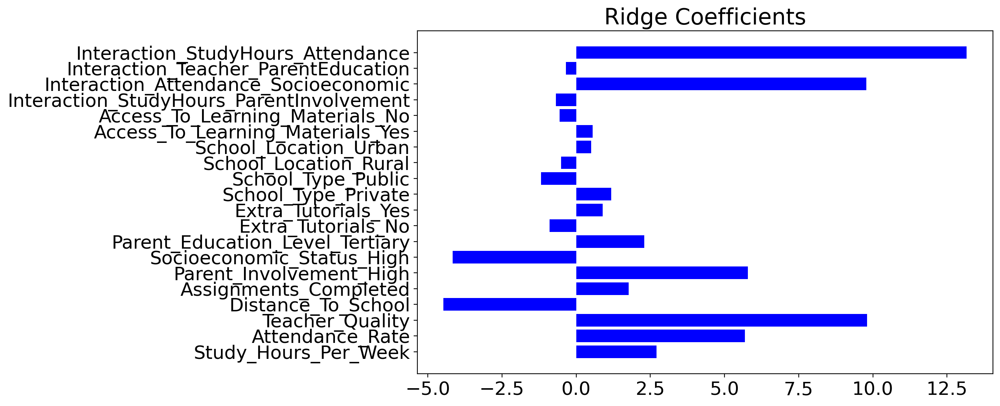

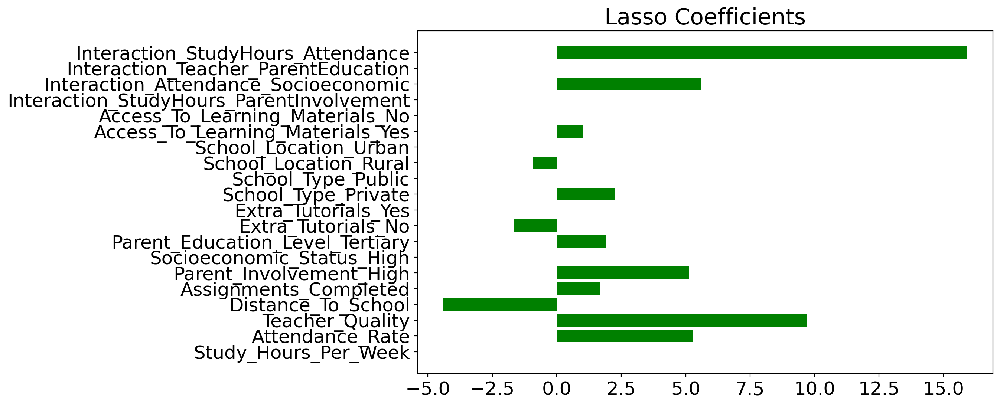

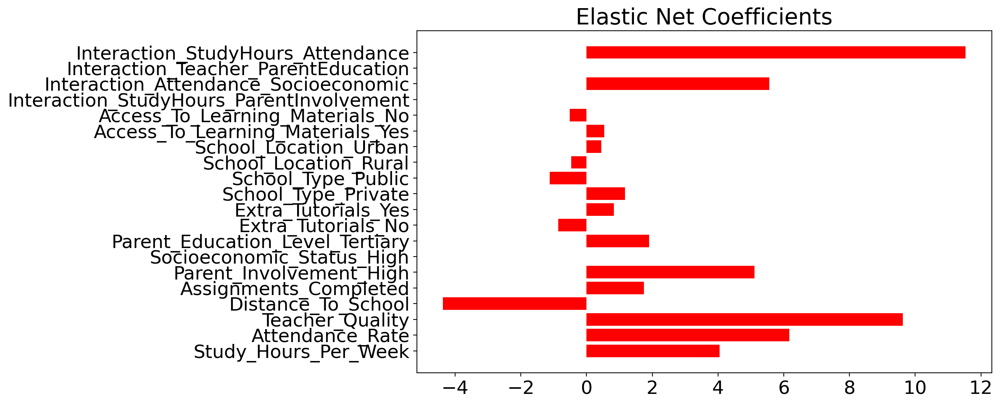

In [91]:
feature_names = X.columns

plt.figure(figsize=(10, 6))
plt.barh(feature_names, best_ridge_model.coef_, color='blue')
plt.title('Ridge Coefficients')
plt.show()

plt.figure(figsize=(10, 6))
plt.barh(feature_names, best_lasso_model.coef_, color='green')
plt.title('Lasso Coefficients')
plt.show()

plt.figure(figsize=(10, 6))
plt.barh(feature_names, best_elastic_net_model.coef_, color='red')
plt.title('Elastic Net Coefficients')
plt.show()


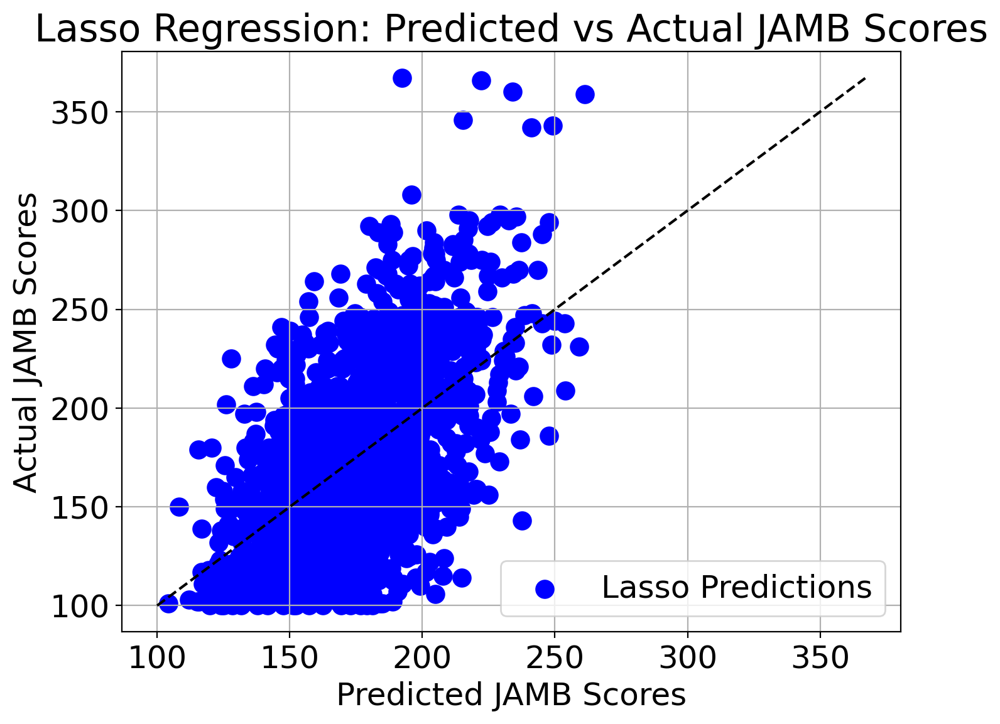

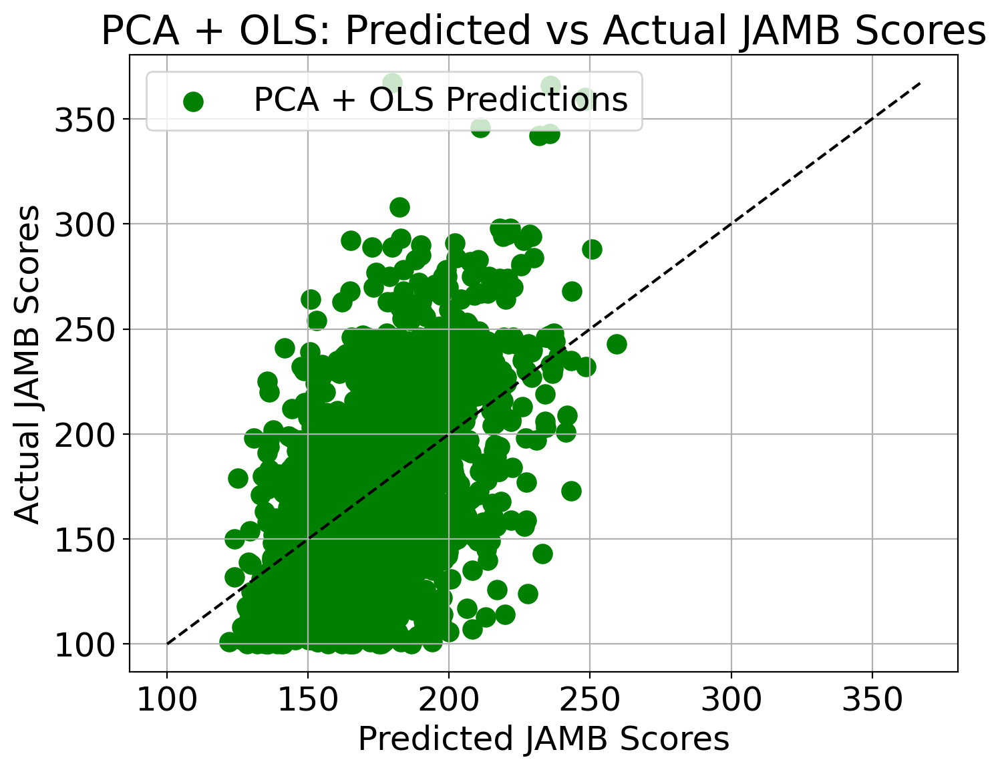

In [92]:
import matplotlib.pyplot as plt

lasso_pred = best_lasso_model.predict(X_test)
pca_ols_pred = ols_model.predict(X_test_pca)

plt.figure(figsize=(8, 6))
plt.scatter(lasso_pred, y_test, color='blue', label='Lasso Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')  
plt.xlabel('Predicted JAMB Scores')
plt.ylabel('Actual JAMB Scores')
plt.title('Lasso Regression: Predicted vs Actual JAMB Scores')
plt.legend()
plt.grid(True)
plt.show()

plt.figure(figsize=(8, 6))
plt.scatter(pca_ols_pred, y_test_pca, color='green', label='PCA + OLS Predictions')
plt.plot([min(y_test_pca), max(y_test_pca)], [min(y_test_pca), max(y_test_pca)], '--k')
plt.xlabel('Predicted JAMB Scores')
plt.ylabel('Actual JAMB Scores')
plt.title('PCA + OLS: Predicted vs Actual JAMB Scores')
plt.legend()
plt.grid(True)
plt.show()


**Polynominal Transformation**

In [94]:
features_to_transform = ['Study_Hours_Per_Week', 'Attendance_Rate', 'Teacher_Quality']

X_poly = A[features_to_transform]
poly = PolynomialFeatures(degree=2)
X_poly_transformed = poly.fit_transform(X_poly)

poly_feature_names = poly.get_feature_names_out(features_to_transform)
X_poly_df_new = pd.DataFrame(X_poly_transformed, columns=poly_feature_names)

A_dr = A.copy()

In [95]:
A_dr_new = A_dr.drop(['Study_Hours_Per_Week', 'Attendance_Rate', 'Teacher_Quality','Distance_To_School'], axis=1)

X_combined = pd.concat([A_dr_new, X_poly_df_new], axis=1)

In [96]:
X_combined_new = X_combined.drop(['Study_Hours_Per_Week', 'Attendance_Rate', 'Teacher_Quality'], axis=1)

X_combined_new

,Assignments_Completed,Parent_Involvement_High,Socioeconomic_Status_High,Parent_Education_Level_Tertiary,Extra_Tutorials_No,Extra_Tutorials_Yes,School_Type_Private,School_Type_Public,School_Location_Rural,School_Location_Urban,...,Interaction_Teacher_ParentEducation,Interaction_StudyHours_Attendance,JAMB_Score,1,Study_Hours_Per_Week^2,Study_Hours_Per_Week Attendance_Rate,Study_Hours_Per_Week Teacher_Quality,Attendance_Rate^2,Attendance_Rate Teacher_Quality,Teacher_Quality^2
0,2,1,0,1,0,1,0,1,0,1,...,4,1716,192,1.0,484.0,1716.0,88.0,6084.0,312.0,16.0
1,1,1,1,0,1,0,0,1,1,0,...,0,1232,207,1.0,196.0,1232.0,56.0,7744.0,352.0,16.0
2,2,1,1,1,0,1,0,1,1,0,...,2,2523,182,1.0,841.0,2523.0,58.0,7569.0,174.0,4.0
3,1,0,0,1,1,0,0,1,0,1,...,2,2871,210,1.0,841.0,2871.0,58.0,9801.0,198.0,4.0
4,1,0,0,1,1,0,0,1,0,1,...,3,1176,199,1.0,144.0,1176.0,36.0,9604.0,294.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4995,2,0,0,0,0,1,0,1,0,1,...,0,1480,183,1.0,400.0,1480.0,40.0,5476.0,148.0,4.0
4996,1,0,0,0,1,0,0,1,1,0,...,0,0,179,1.0,0.0,0.0,0.0,6400.0,160.0,4.0
4997,3,0,0,0,1,0,0,1,0,1,...,0,1513,261,1.0,289.0,1513.0,51.0,7921.0,267.0,9.0
4998,1,0,0,0,1,0,0,1,1,0,...,0,1440,183,1.0,225.0,1440.0,30.0,9216.0,192.0,4.0


In [97]:
X = X_combined_new.drop(['JAMB_Score','1'], axis=1)
y = X_combined_new['JAMB_Score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [98]:
X_train_const = sm.add_constant(X_train)
X_test_const = sm.add_constant(X_test)

ols_model = sm.OLS(y_train, X_train_const).fit()
print(ols_model.summary())

y_pred_ols = ols_model.predict(X_test_const)

ols_rmse = np.sqrt(mean_squared_error(y_test, y_pred_ols))
ols_r2 = r2_score(y_test, y_pred_ols)

print(f"OLS RMSE: {ols_rmse}")
print(f"OLS R²: {ols_r2}")

                            OLS Regression Results                            
Dep. Variable:             JAMB_Score   R-squared:                       0.316
Model:                            OLS   Adj. R-squared:                  0.313
Method:                 Least Squares   F-statistic:                     94.59
Date:                Thu, 14 Nov 2024   Prob (F-statistic):          2.21e-271
Time:                        17:38:40   Log-Likelihood:                -17788.
No. Observations:                3500   AIC:                         3.561e+04
Df Residuals:                    3482   BIC:                         3.572e+04
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [99]:
boosted_jamb = GradientBoostingRegressor(n_estimators = 500, #Number of trees
                                           learning_rate = 0.01,  #lambda
                                           max_depth = 4, 
                                           random_state = 1)

boosted_jamb.fit(X_train, y_train)

GradientBoostingRegressor(learning_rate=0.01, max_depth=4, n_estimators=500,
                          random_state=1)

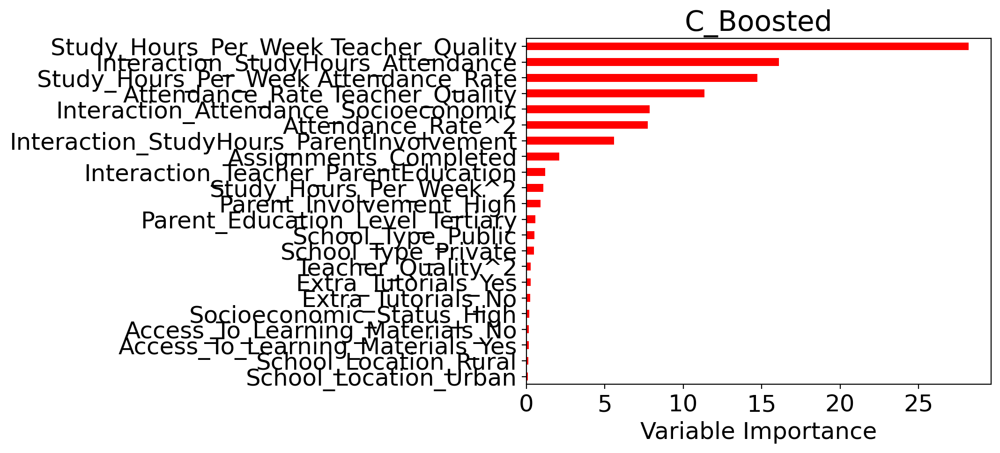

In [100]:
feature_importance = boosted_jamb.feature_importances_*100

rel_imp = pd.Series(feature_importance, 
                    index = X.columns).sort_values(inplace = False)

rel_imp.T.plot(kind = 'barh', 
               color = 'r', )

plt.xlabel('Variable Importance')

plt.gca().legend_ = None
plt.title("C_Boosted")
plt.show()

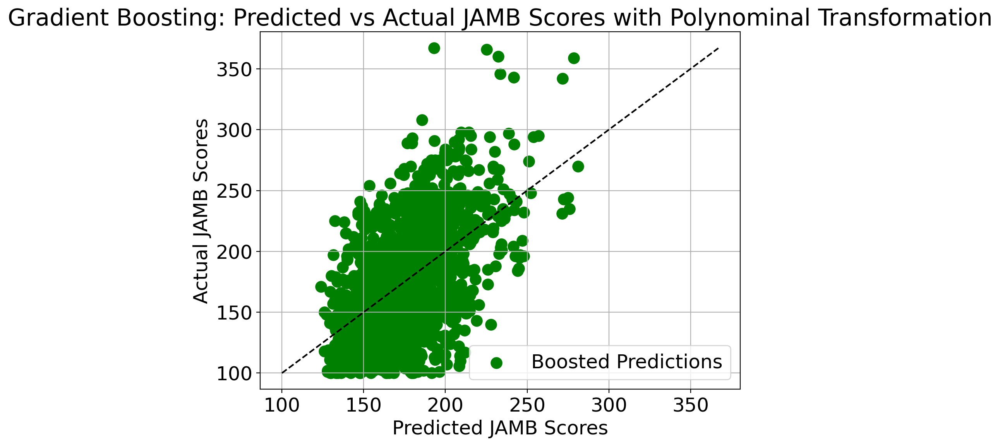

In [101]:
y_pred_boosted = boosted_jamb.predict(X_test)

residuals_boosted = y_test - y_pred_boosted

plt.figure(figsize=(8, 6))
plt.scatter(y_pred_boosted, y_test, color='green', label='Boosted Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k')  
plt.xlabel('Predicted JAMB Scores')
plt.ylabel('Actual JAMB Scores')
plt.title('Gradient Boosting: Predicted vs Actual JAMB Scores with Polynominal Transformation')
plt.legend()
plt.grid(True)
plt.show()

In [102]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 22 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Assignments_Completed                     5000 non-null   int64  
 1   Parent_Involvement_High                   5000 non-null   uint8  
 2   Socioeconomic_Status_High                 5000 non-null   uint8  
 3   Parent_Education_Level_Tertiary           5000 non-null   uint8  
 4   Extra_Tutorials_No                        5000 non-null   uint8  
 5   Extra_Tutorials_Yes                       5000 non-null   uint8  
 6   School_Type_Private                       5000 non-null   uint8  
 7   School_Type_Public                        5000 non-null   uint8  
 8   School_Location_Rural                     5000 non-null   uint8  
 9   School_Location_Urban                     5000 non-null   uint8  
 10  Access_To_Learning_Materials_Yes    

In [103]:
def processSubset(feature_set):
    model = sm.OLS(y, X[list(feature_set)]).fit()
    RSS = ((model.predict(X[list(feature_set)]) - y) ** 2).sum()
    return {"model": model, "RSS": RSS}

def getBest(k):
    results = []
    for combo in itertools.combinations(X.columns, k):
        results.append(processSubset(combo))
    models = pd.DataFrame(results)
    best_model = models.loc[models['RSS'].argmin()]
    return best_model

models_best = pd.DataFrame(columns=["RSS", "model"])
max_predictors = 5 
for i in range(1, max_predictors + 1):
    models_best.loc[i] = getBest(i)

print(models_best)

print(getBest(5)["model"].summary())

               RSS                                              model
1  13340218.907671  <statsmodels.regression.linear_model.Regressio...
2  10253041.566711  <statsmodels.regression.linear_model.Regressio...
3   8732804.731674  <statsmodels.regression.linear_model.Regressio...
4    8081446.27783  <statsmodels.regression.linear_model.Regressio...
5   7863918.841728  <statsmodels.regression.linear_model.Regressio...
                            OLS Regression Results                            
Dep. Variable:             JAMB_Score   R-squared:                       0.306
Model:                            OLS   Adj. R-squared:                  0.306
Method:                 Least Squares   F-statistic:                     551.1
Date:                Thu, 14 Nov 2024   Prob (F-statistic):               0.00
Time:                        17:48:15   Log-Likelihood:                -25496.
No. Observations:                5000   AIC:                         5.100e+04
Df Residuals:              

In [104]:
X_chosen = X = X_combined_new.drop(['JAMB_Score','1'], axis=1)
y = X_combined_new['JAMB_Score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [105]:
feature_set = ('School_Type_Private','School_Type_Public','Interaction_Attendance_Socioeconomic','Interaction_StudyHours_Attendance','Attendance_Rate Teacher_Quality')

In [106]:
model = sm.OLS(y_train, X_train[list(feature_set)]).fit()

y_pred = model.predict(X_test[list(feature_set)])

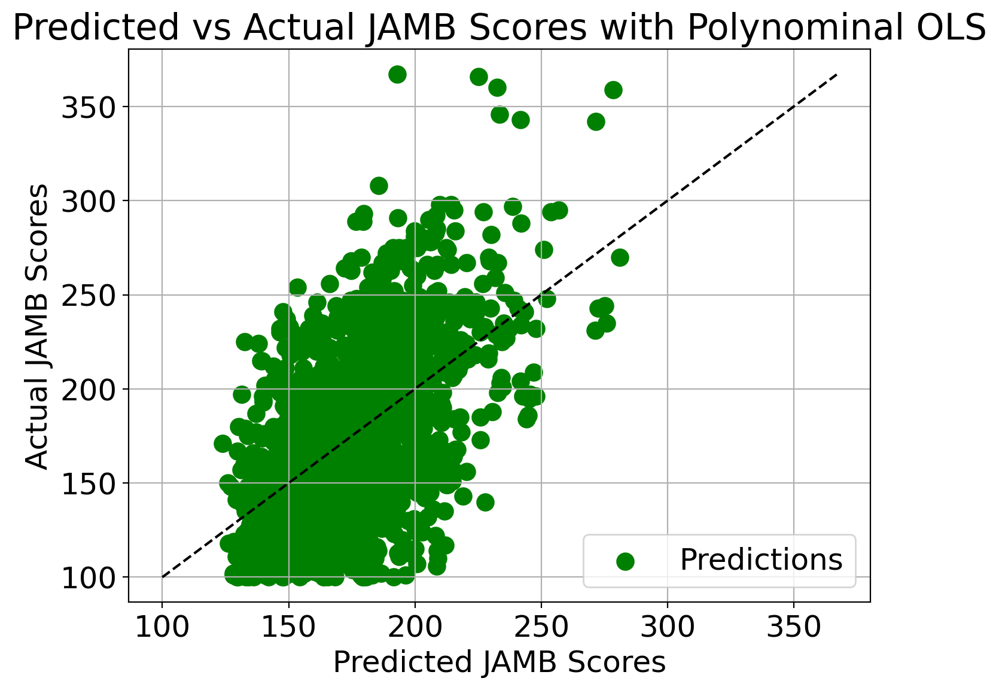

In [107]:
residuals_boosted = y_test - y_pred

plt.figure(figsize=(8, 6))
plt.scatter(y_pred_boosted, y_test, color='green', label='Predictions')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], '--k') 
plt.xlabel('Predicted JAMB Scores')
plt.ylabel('Actual JAMB Scores')
plt.title('Predicted vs Actual JAMB Scores with Polynominal OLS')
plt.legend()
plt.grid(True)
plt.show()